## Dimensionality Reduction and Feature Extraction
### Principal Component Analysis (PCA)

Firstly, a dataset is generated comprising two features. Feature one is a set of values drawn from a standard normal distribution. For feature two, random noise is added to feature one. This noise is also normally distributed but with a smaller standard deviation, resulting in feature two having less variation and therefore being closely correlated to feature one.

Subsequent to creating the dataset, standardisation is applied. Standardisation is the process of scaling the features such that they have a mean of zero and a standard deviation of one. This is a crucial step in many machine learning algorithms, including PCA, as it ensures that the outcome is not biased by the original scale of the features.

Following this, the original, standardised data is visualised in a scatter plot. Each dot represents an observation, with the colour denoting the sequence of data points.

Next, PCA is performed. The aim of PCA is to find and rank the axes in the data space along which the data varies the most. These new axes, termed principal components, are orthogonal (at right angles to each other), and they are linear combinations of the original features. The first principal component is the axis along which the data varies the most, while the second principal component is the axis orthogonal to the first that captures the maximum remaining variance, and so on. 

The data is then transformed by aligning it with these principal components, resulting in a rotation of the original data space. The transformed data is visualised in a second scatter plot.

Dimensionality reduction is performed next. This process involves discarding some of the principal components, typically the ones corresponding to lower variance. In the code, this step is demonstrated by keeping only the first principal component, effectively reducing the data's dimensionality from two dimensions to one.

The reduced data is visualised in a third plot. Now, the data points are aligned along the first principal component in a one-dimensional space.

Finally, the PCA transformation is reversed, bringing the data back into the original feature space. This is achieved by multiplying the dimensionality-reduced data with the principal components. The result is a dataset with the same number of features as the original data but reduced variance. In this case, all points lie along the direction of the first principal component. The result of this transformation is visualised in a fourth scatter plot.

In conclusion, this process demonstrates how PCA can be used to find the directions in which data varies the most, reduce dimensionality by discarding less important directions, and reconstruct the data in the original feature space but with reduced variance. It's a powerful tool for data exploration, noise reduction, and feature extraction.

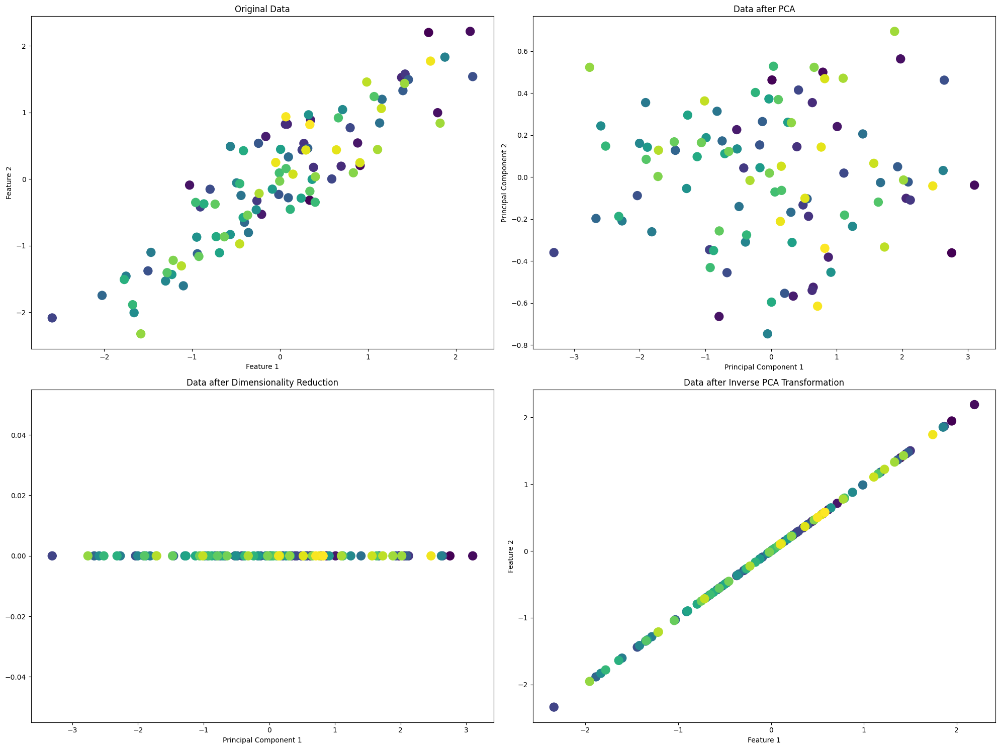

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

# Create a random dataset of two features
np.random.seed(0)
feature1 = np.random.normal(0, 1, 100)
feature2 = feature1 + np.random.normal(0, 0.5, 100)  # less variation in feature 2
data = pd.DataFrame({'Feature1': feature1, 'Feature2': feature2})

# Scaling the features to have zero mean and unit variance
scaler = StandardScaler()
data_scaled = scaler.fit_transform(data)

# Plot the original data
plt.figure(figsize=(20, 15))

plt.subplot(2, 2, 1)
plt.scatter(data_scaled[:, 0], data_scaled[:, 1], c=range(len(data_scaled)), cmap='viridis', s=150)
plt.title('Original Data')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')

# Perform PCA
pca = PCA(n_components=2)
data_pca = pca.fit_transform(data_scaled)

# Plot the data after PCA transformation
plt.subplot(2, 2, 2)
plt.scatter(data_pca[:, 0], data_pca[:, 1], c=range(len(data_pca)), cmap='viridis', s=150)
plt.title('Data after PCA')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')

# Perform PCA with only the most significant component
pca = PCA(n_components=1)
data_pca = pca.fit_transform(data_scaled)

# Plot the data after dimensionality reduction
plt.subplot(2, 2, 3)
plt.scatter(data_pca, [0]*len(data_pca), c=range(len(data_pca)), cmap='viridis', s=150)
plt.title('Data after Dimensionality Reduction')
plt.xlabel('Principal Component 1')

# Reverse PCA transformation
data_inverse = pca.inverse_transform(data_pca)

# Plot the data after reversing PCA transformation
plt.subplot(2, 2, 4)
plt.scatter(data_inverse[:, 0], data_inverse[:, 1], c=range(len(data_inverse)), cmap='viridis', s=150)
plt.title('Data after Inverse PCA Transformation')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')

plt.tight_layout()
plt.show()


### Applying PCA for improved dataset visualisation

One of the widely used applications of Principal Component Analysis (PCA) is to visually represent high-dimensional datasets. When dealing with data that has more than two features, it becomes challenging to create scatter plots for comprehensive visualization. However, there is a simpler alternative available: computing histograms for each feature. Let's explore an example using the Breast Cancer Dataset:

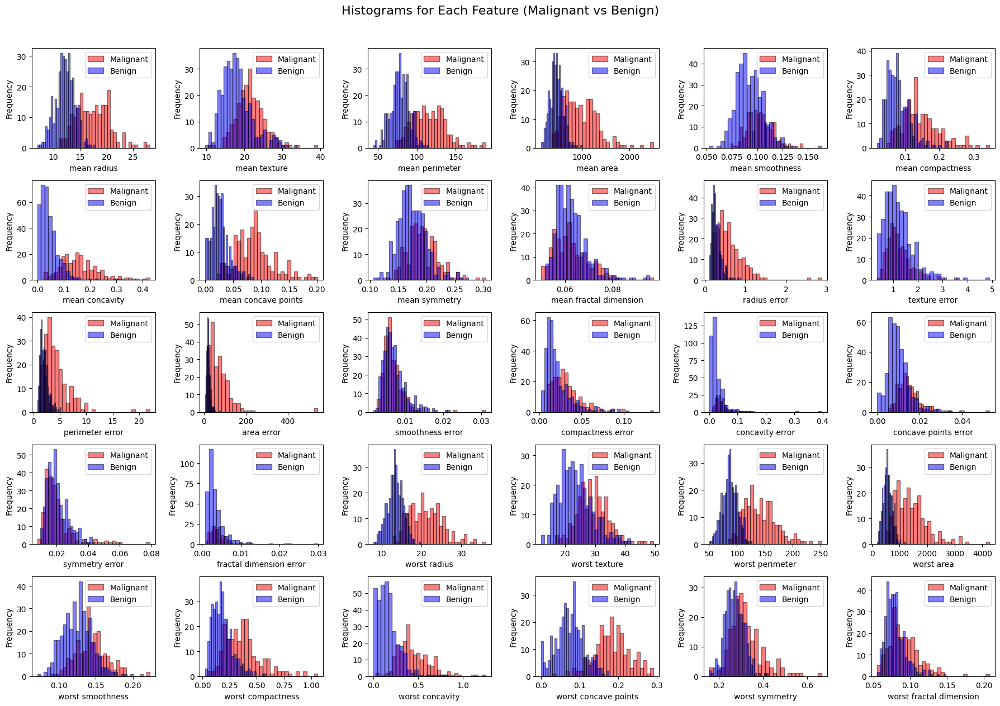

In [2]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.datasets import load_breast_cancer
from sklearn.decomposition import PCA

# Load Breast Cancer Dataset
data = load_breast_cancer()
X = data.data
y = data.target

# Perform PCA
pca = PCA(n_components=2)
transformed_data = pca.fit_transform(X)

# Separate samples by class
malignant_samples = X[y == 0]
benign_samples = X[y == 1]

# Plotting histograms for each feature
n_features = X.shape[1]
n_bins = 30  # Number of bins for histogram

fig, axes = plt.subplots(nrows=5, ncols=6, figsize=(18, 12))
fig.subplots_adjust(hspace=0.5)

for i, ax in enumerate(axes.flatten()):
    ax.hist(malignant_samples[:, i], bins=n_bins, alpha=0.5, color='red', label='Malignant', edgecolor='black')
    ax.hist(benign_samples[:, i], bins=n_bins, alpha=0.5, color='blue', label='Benign', edgecolor='black')
    ax.set_xlabel(data.feature_names[i])
    ax.set_ylabel("Frequency")
    ax.legend()

plt.tight_layout()
plt.suptitle("Histograms for Each Feature (Malignant vs Benign)", fontsize=16, y=1.05)
plt.show()


In these plots, we create a histogram for each of the features, counting how often a data point appears with a feature in a certain range (called a bin). Each plot overlays two histograms, one for all of the points in the benign class (blue) and one for all the points in the malignant class (red). This gives us some idea of how each feature is distributed across the two classes, and allows us to venture a guess as to which features are better at distinguishing malignant and benign samples. For example, the feature "smoothness error" seems quite uninformative, because the two histograms mostly overlap, while the feature "worst concave points" seems quite informative, because the histograms are quite disjoint.

However, this plot doesn’t show us anything about the interactions between variables and how these relate to the classes. Using PCA, we can capture the main interactions and get a slightly more complete picture. We can find the first two principal components, and visualise the data in this new two-dimensional space with a single scatter plot.

By plotting the data points in this new PCA space, we can gain a more holistic view of the dataset. This visualisation allows us to observe the overall patterns, relationships, and separability between the classes. It provides a more comprehensive representation of the data, taking into account the interactions between features and their impact on classification.

By combining the insights gained from both the histogram analysis and the PCA scatter plot, we can develop a deeper understanding of the dataset's structure, identify informative features, and make more informed decisions when it comes to classification tasks such as distinguishing between malignant and benign samples.

### Applying the PCA transformation

Learning and applying the PCA transformation is straightforward and can be treated as a preprocessing step. We start by creating an instance of the PCA object. Then, we find the principal components by invoking the fit method on our data. Once the principal components are determined, we can apply the rotation and dimensionality reduction by calling the transform method.

By default, PCA performs the rotation and shifting of the data, preserving all the principal components. However, if we wish to reduce the dimensionality of our data, we need to specify the desired number of components when creating the PCA object. This allows us to indicate how many principal components we want to retain.

For example, if we set the number of components to 2, PCA will identify the two most informative principal components. These components capture the maximum variance in the data, summarizing the essential information contained within it. The remaining components, if any, will be discarded, resulting in a lower-dimensional representation of the data.

It is important to consider the trade-off between the amount of information retained and the dimensionality reduction achieved. Retaining fewer components may result in some loss of information, but it can simplify the data representation and potentially enhance interpretability and computational efficiency in subsequent tasks.

Therefore, when using PCA, we need to decide on the appropriate number of components based on our specific requirements, balancing the need for dimensionality reduction with the goal of preserving as much relevant information as possible. It is also very important to scale the data before applying PCA, as it is sensitive to the scale of the features.

Plot the first two principal components:

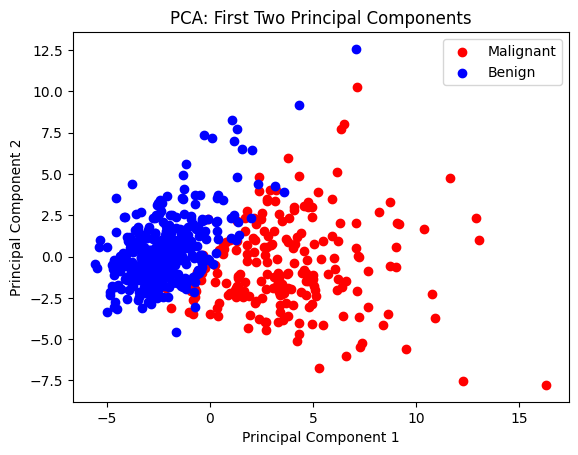

In [3]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.datasets import load_breast_cancer
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

# Load Breast Cancer Dataset
data = load_breast_cancer()
X = data.data
y = data.target

# Scale the data using StandardScaler
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Instantiate PCA object and specify the desired number of components
n_components = 2
pca = PCA(n_components=n_components)

# Fit the PCA model to the scaled data
pca.fit(X_scaled)

# Apply the PCA transformation to the scaled data
transformed_data = pca.transform(X_scaled)

# Create separate arrays for malignant and benign samples
malignant_samples = transformed_data[y == 0]
benign_samples = transformed_data[y == 1]

# Plot the first two principal components with different colors for malignant and benign
plt.scatter(malignant_samples[:, 0], malignant_samples[:, 1], color='red', label='Malignant')
plt.scatter(benign_samples[:, 0], benign_samples[:, 1], color='blue', label='Benign')

plt.xlabel("Principal Component 1")
plt.ylabel("Principal Component 2")
plt.title("PCA: First Two Principal Components")
plt.legend()
plt.show()


It is worth noting that PCA is an unsupervised method, meaning it does not consider class information when determining the rotation of the data. Instead, it focuses on identifying correlations within the data. In the scatter plot presented here, we plotted the first principal component against the second principal component and then utilised the class information to assign colours to the data points.

By examining the scatter plot, we can observe a clear separation between the two classes in this two-dimensional space. This suggests that even a linear classifier, which would learn a line in this space, could effectively distinguish between the two classes. Additionally, it is evident that the malignant samples (depicted in red) exhibit a greater spread compared to the benign samples (depicted in blue).

However, one limitation of PCA is that the axes in the plot are often challenging to interpret directly. The principal components represent directions in the original data and are combinations of the original features. Nevertheless, these combinations tend to be intricate and intricate, as we will explore shortly. The principal components themselves are stored in the `components_` attribute of the PCA object during the fitting process.

In [4]:
print("PCA component shape: {}".format(pca.components_.shape))

PCA component shape: (2, 30)


The `components_` attribute of PCA provides valuable insights into the principal components obtained from the analysis. Each row in `components_` corresponds to a specific principal component, sorted in order of importance. For instance, the first row represents the first principal component, the second row corresponds to the second principal component, and so on. 

On the other hand, the columns in `components_` correspond to the original features present in the dataset. For instance, if we consider the "Breast Cancer" dataset, the columns might represent attributes such as "mean radius," "mean texture," and so forth.

To gain a better understanding of the principal components, we can examine the content of `components_`. Each element in `components_` reflects the weight or coefficient assigned to the corresponding original feature in the creation of the respective principal component. These coefficients highlight the contribution of each original feature to the principal component.

To facilitate comprehension, we can visualize these coefficients using a heat map. A heat map represents the coefficients as a colour-coded grid, making it easier to identify patterns and relationships. Darker colours usually indicate higher coefficients, while lighter colours indicate lower coefficients. By examining the heat map, we can discern the relative importance and influence of the original features in each principal component.

The heat map provides a visual summary of the relationships between the original features and the principal components. It offers a valuable tool for understanding the underlying structure and significance of the data attributes in the dimensionality reduction process achieved by PCA.

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst radius,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension
PC1,0.218902,0.103725,0.227537,0.220995,0.142590,0.239285,0.258400,0.260854,0.138167,0.064363,...,0.227997,0.104469,0.236640,0.224871,0.127953,0.210096,0.228768,0.250886,0.122905,0.131784
PC2,-0.233857,-0.059706,-0.215181,-0.231077,0.186113,0.151892,0.060165,-0.034768,0.190349,0.366575,...,-0.219866,-0.045467,-0.199878,-0.219352,0.172304,0.143593,0.097964,-0.008257,0.141883,0.275339


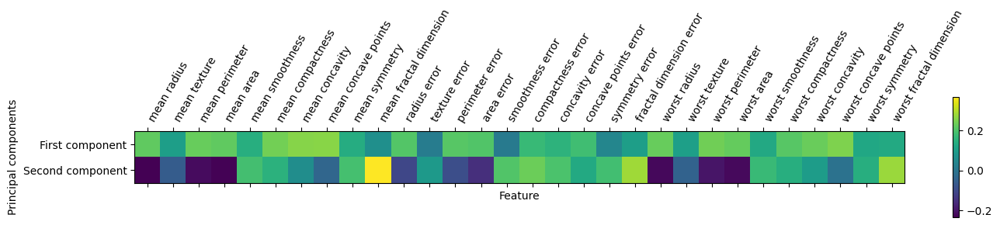

In [5]:
import matplotlib.pyplot as plt
from sklearn.datasets import load_breast_cancer
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

# Load Breast Cancer Dataset
breast_cancer_dataset = load_breast_cancer()
X = breast_cancer_dataset.data

# Scale the data using StandardScaler
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Instantiate PCA object and fit to the scaled data
pca = PCA(n_components=2)
pca.fit(X_scaled)

# Create a data frame with the PCA components
components_df = pd.DataFrame(data=pca.components_, columns=breast_cancer_dataset.feature_names, index=['PC1', 'PC2'])
display(components_df)

# Create a heat map of the coefficients
plt.matshow(pca.components_, cmap='viridis')
plt.yticks([0, 1], ["First component", "Second component"])
plt.colorbar()
plt.xticks(range(len(breast_cancer_dataset.feature_names)), breast_cancer_dataset.feature_names, rotation=60, ha='left')
plt.xlabel("Feature")
plt.ylabel("Principal components")
plt.show()


The heatmap provides insights into the relationship between the original features and the principal components. Each cell in the heatmap represents a coefficient value, indicating the strength and direction of the relationship between a specific feature and a principal component.

When examining the heatmap, you can observe certain patterns and interpret them to gain a better understanding of the data. For example, if in the first component, all features have the same sign (positive or negative), it suggests a general correlation between all features. This means that when one feature has a high value, the other features are likely to have high values as well. Similarly, if all features have the same negative sign, it implies an inverse relationship between the features.

On the other hand, if the second component exhibits mixed signs (positive and negative), it indicates a more complex relationship. Some features may have a positive correlation with the second component, while others may have a negative correlation. This mixed sign pattern suggests that different subsets of features contribute to the second component, possibly capturing different aspects of the data.

Furthermore, it's important to note that both the first and second components involve all of the 30 features. This means that both principal components take into account information from every feature in the dataset. This highlights the comprehensive nature of the principal components, encompassing the collective information present in all the features.

By analysing the heatmap and understanding the patterns in the coefficients, you can gain insights into the relationships between the original features and the principal components. This understanding aids in comprehending the underlying structure and significance of the data attributes in the dimensionality reduction achieved by PCA.

### PCA for feature extraction

Another valuable application of PCA is feature extraction. The concept behind feature extraction is to discover a data representation that is more suitable for analysis than the original raw representation. An excellent example of where feature extraction proves beneficial is in working with images. Images consist of pixels, typically stored as red, green, and blue (RGB) intensities, and working with them in their raw form can be challenging.

Feature extraction allows us to transform the image data into a more informative and compact representation. Instead of considering each individual pixel as a separate feature, we can extract meaningful features that capture essential characteristics of the image. These features could represent patterns, shapes, or other relevant visual attributes.

By applying PCA for feature extraction on images, we can obtain a lower-dimensional representation that captures the most significant variations in the dataset. The principal components derived from PCA can be seen as a compressed version of the image data, where each component represents a combination of pixels that contributes most to the overall variance.

This dimensionality reduction achieved through PCA enables more efficient analysis and processing of images. It helps in tasks such as image recognition, object detection, and image compression. By extracting relevant features, we can focus on the most important aspects of the images while discarding redundant or less informative pixel-level details.

Through feature extraction with PCA, we transform complex image data into a more manageable and meaningful representation, facilitating subsequent analysis and interpretation. This process plays a crucial role in extracting valuable insights from image datasets and paves the way for various applications in computer vision and image processing.

In this example, we use the fetch_lfw_people function from scikit-learn to load the LFW dataset. We specify min_faces_per_person=50 to ensure a sufficient number of samples for each individual and resize=0.4 to resize the images for faster computation.


Step 1: Fetching and Displaying the LFW Dataset
- We start by fetching the LFW dataset using `fetch_lfw_people` and storing the data in `X` and the corresponding labels in `y`. We also obtain the target names (`target_names`) for labelling purposes.
- We display example images for each person in a 5x5 grid using subplots. This helps us visualize the dataset and gain a better understanding of its structure and content.

Step 2: Counting the Frequency of Each Target
- To understand the distribution of the dataset, we count the frequency of each target (person) in the original dataset using `np.unique` with `return_counts=True`. This provides us with the unique targets and their corresponding counts.
- We then iterate over the unique targets and print the target name along with its count. This gives us insights into the distribution of the dataset and the number of photos available for each person.

Step 3: Reducing Skewing by Limiting the Number of Photos per Person
- We reduce the skewing in the dataset by limiting the number of photos per person. In this case, we set `max_photos_per_person` to 50, ensuring a balanced representation.
- We calculate the counts of each person's photos using `np.unique` and `return_counts=True` to obtain `unique_people` and `person_counts`. These arrays help us iterate over each person and select a maximum of `max_photos_per_person` indices for each person.
- We collect these filtered indices in `filtered_indices` to create filtered versions of `X` and `y` as `filtered_X` and `filtered_y`, respectively. This ensures that the resulting dataset has an equal representation of different individuals.

Step 4: Shuffling the Filtered Dataset Representation
- To avoid any bias or order-related patterns in the dataset, we shuffle the representation of the filtered dataset. We first create an array of shuffled indices (`shuffled_indices`) using `np.arange` and then shuffle them using `np.random.shuffle`.
- We use the shuffled indices to reorder `filtered_X` and `filtered_y`, resulting in a shuffled representation of the filtered dataset.

Step 5: Displaying Example Images after Reducing Skewing
- We display example images from the filtered dataset after reducing the skewing in a similar manner to the previous subplot grid. These images now represent a more balanced representation of different individuals.
- The shuffled representation ensures that the images are displayed in a random order, avoiding any potential biases in the visual representation.

Step 6: Counting the Frequency of Each Target after Reducing the Skewing
- We count the frequency of each target in the filtered dataset after reducing the skewing using `np.unique` with `return_counts=True`. This provides us with the unique filtered targets and their respective counts.
- We iterate over the unique filtered targets and print the target name along with its count. This allows us to observe the distribution of the filtered dataset and verify that the skewing has been effectively reduced.

By running this code, students will be able to fetch and explore the LFW dataset, understand the skewing effect, reduce the skewing by limiting the number of photos per person, shuffle the representation, and observe the impact of these steps on the dataset's representation and target frequency.

Feel free to discuss and analyze the results further or modify the code to suit your specific needs and learning objectives.

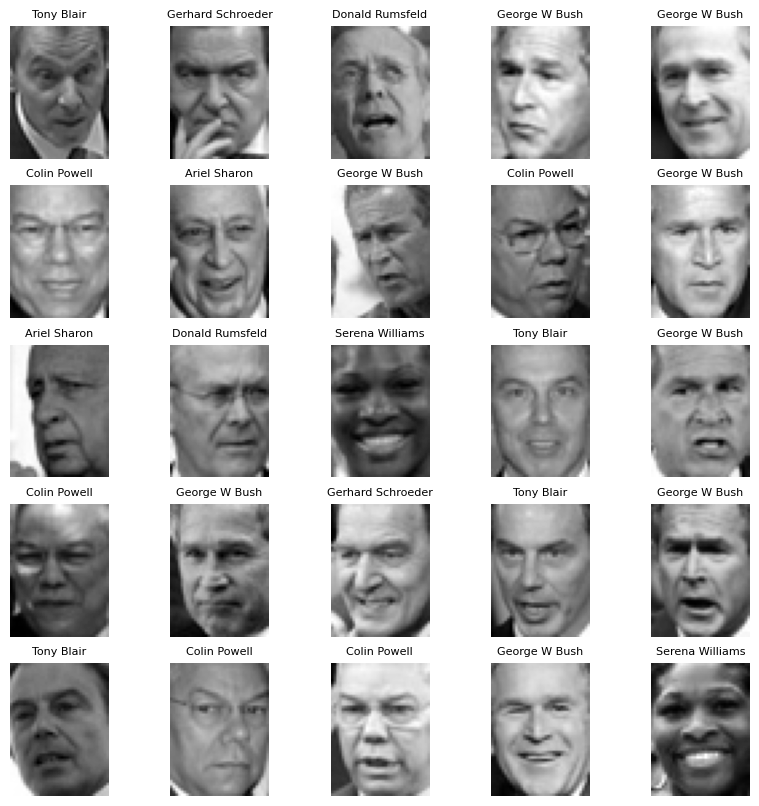

In [6]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.datasets import fetch_lfw_people

# Fetch LFW dataset
lfw_dataset = fetch_lfw_people(min_faces_per_person=50, resize=0.4)
X = lfw_dataset.data
y = lfw_dataset.target
target_names = lfw_dataset.target_names

# Scale grayscale values to be between 0 and 1
X = X / 255.0

# Display example images for each person
fig, axes = plt.subplots(5, 5, figsize=(10, 10))
for i, ax in enumerate(axes.flat):
    ax.imshow(X[i].reshape(lfw_dataset.images.shape[1:]), cmap='gray')
    ax.axis('off')
    ax.set_title(target_names[y[i]], fontsize=8)


<Figure size 640x480 with 0 Axes>

Target: Ariel Sharon | Count: 77
Target: Colin Powell | Count: 236
Target: Donald Rumsfeld | Count: 121
Target: George W Bush | Count: 530
Target: Gerhard Schroeder | Count: 109
Target: Hugo Chavez | Count: 71
Target: Jacques Chirac | Count: 52
Target: Jean Chretien | Count: 55
Target: John Ashcroft | Count: 53
Target: Junichiro Koizumi | Count: 60
Target: Serena Williams | Count: 52
Target: Tony Blair | Count: 144


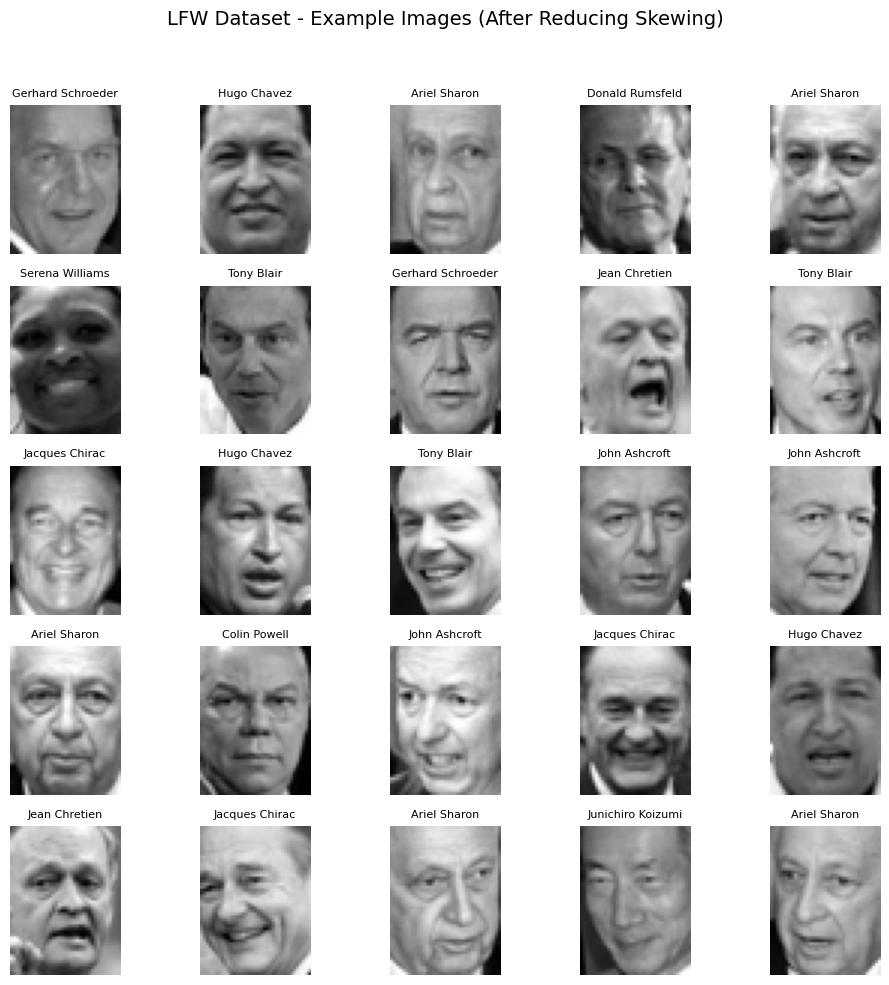


Target frequencies after reducing the skewing:
Target: Ariel Sharon | Count: 50
Target: Colin Powell | Count: 50
Target: Donald Rumsfeld | Count: 50
Target: George W Bush | Count: 50
Target: Gerhard Schroeder | Count: 50
Target: Hugo Chavez | Count: 50
Target: Jacques Chirac | Count: 50
Target: Jean Chretien | Count: 50
Target: John Ashcroft | Count: 50
Target: Junichiro Koizumi | Count: 50
Target: Serena Williams | Count: 50
Target: Tony Blair | Count: 50


In [7]:

plt.suptitle("LFW Dataset - Example Images", fontsize=14)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

# Count the frequency of each target
unique_targets, target_counts = np.unique(y, return_counts=True)

# Print the counts
for target, count in zip(unique_targets, target_counts):
    print(f"Target: {target_names[target]} | Count: {count}")

# Reduce skewing by limiting the number of photos per person
max_photos_per_person = 50
unique_people, person_counts = np.unique(y, return_counts=True)
filtered_indices = []
for person in unique_people:
    indices = np.where(y == person)[0]
    filtered_indices.extend(indices[:max_photos_per_person])
filtered_X = X[filtered_indices]
filtered_y = y[filtered_indices]

# Shuffle the filtered dataset representation
shuffled_indices = np.arange(filtered_X.shape[0])
np.random.shuffle(shuffled_indices)
filtered_X = filtered_X[shuffled_indices]
filtered_y = filtered_y[shuffled_indices]

# Display example images after reducing skewing
fig, axes = plt.subplots(5, 5, figsize=(10, 10))
for i, ax in enumerate(axes.flat):
    ax.imshow(filtered_X[i].reshape(lfw_dataset.images.shape[1:]), cmap='gray')
    ax.axis('off')
    ax.set_title(target_names[filtered_y[i]], fontsize=8)

plt.suptitle("LFW Dataset - Example Images (After Reducing Skewing)", fontsize=14)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

# Count the frequency of each target after reducing the skewing
unique_filtered_targets, filtered_target_counts = np.unique(filtered_y, return_counts=True)

# Print the counts after reducing the skewing
print("\nTarget frequencies after reducing the skewing:")
for target, count in zip(unique_filtered_targets, filtered_target_counts):
    print(f"Target: {target_names[target]} | Count: {count}")


In the field of face recognition, a common task is to determine whether a newly encountered face belongs to a known individual from a database. This task finds its applications in various domains such as photo collection management, social media platforms, and security systems. One approach to tackling this problem would involve building a classifier where each person is treated as a separate class. However, face databases typically contain numerous different individuals with very few images available per person. This scarcity of training examples per class poses challenges for most classifiers. Furthermore, it is desirable to have a system that can easily accommodate new individuals without requiring extensive retraining of a large model.

A straightforward solution is to employ a one-nearest-neighbor classifier, which searches for the most similar face image to the face being classified. This classifier has the advantage that it can potentially work with just a single training example per class. Now, let's delve into how well the KNeighborsClassifier performs in this context:

In [8]:
# this code is to be run after the previous code cell

from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import train_test_split

# Split the dataset into training and test sets
X_train, X_test, y_train, y_test = train_test_split(filtered_X, filtered_y, test_size=0.2, random_state=42)

# Create and fit the K-nearest neighbors classifier
knn_classifier = KNeighborsClassifier(n_neighbors=1)
knn_classifier.fit(X_train, y_train)

# Evaluate the classifier on the test set
accuracy = knn_classifier.score(X_test, y_test)
print(f"Accuracy of K-nearest neighbors classifier: {accuracy:.2f}")

Accuracy of K-nearest neighbors classifier: 0.42


We split the dataset into training and test sets using train_test_split. This allows us to train the classifier on a portion of the data and evaluate its performance on unseen test data.

We create an instance of the K-nearest neighbors classifier (KNeighborsClassifier) with n_neighbors=1, indicating that we want to consider only the closest neighbor for classification.

The classifier is then fitted to the training data using the fit method, enabling it to learn the relationships between the face images and their corresponding labels.

Finally, we evaluate the performance of the classifier on the test set using the score method, which calculates the accuracy of the classifier by comparing the predicted labels to the true labels.

By running this code, you will obtain the accuracy of the K-nearest neighbors classifier in identifying previously unseen faces. This accuracy serves as a measure of how well the classifier performs in the face recognition task.

#### Using the PCA

PCA (Principal Component Analysis) comes to our aid in addressing the limitations of using pixel distances for measuring similarity between faces. Comparing images based solely on their pixel values is not an effective way to capture the nuances of facial features. When comparing two images using a pixel representation, we simply compare the grayscale value of each pixel to the corresponding pixel in the other image. However, this raw pixel representation differs significantly from how humans perceive and interpret facial images.

Consider this: if we measure similarity based on pixel distances, even a slight shift of a face by just one pixel to the right would result in a drastically different representation. Such a representation fails to capture the true essence of facial features. To overcome this challenge, we can leverage PCA and distances along principal components to potentially improve the accuracy of our face recognition system.

In this code snippet, we enable the "whitening" option of PCA. Whitening involves rescaling the principal components to have the same scale. This rescaling is analogous to using StandardScaler after the PCA transformation. By incorporating whitening into our PCA analysis, we not only rotate the data but also ensure that the center panel of the transformed data resembles a circular shape rather than an ellipse.

This transformation allows us to capture the most important features of the face by reducing the impact of irrelevant variations such as lighting conditions or facial position. With PCA's ability to extract essential facial characteristics, we move closer to a representation that aligns with human interpretation, leading to improved accuracy in face recognition tasks.

Feel free to experiment with different PCA configurations and explore other options to further enhance the accuracy and effectiveness of your face recognition system.

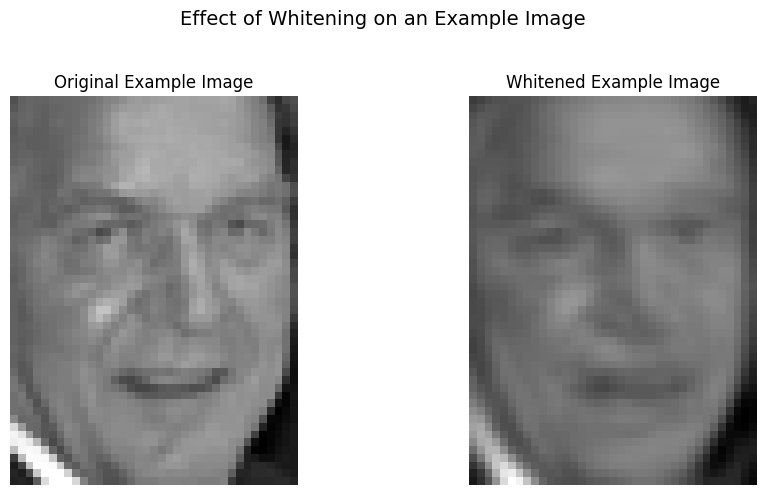

In [9]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

# Apply PCA with whitening
pca = PCA(n_components=50, whiten=True)
X_pca = pca.fit_transform(filtered_X)

# Visualize the effect of whitening on an example image
example_index = 0  # Choose an index for the example image
example_image = filtered_X[example_index].reshape(lfw_dataset.images.shape[1:])
whitened_example_image = pca.inverse_transform(X_pca[example_index]).reshape(lfw_dataset.images.shape[1:])

# Display the original and whitened example images
fig, axes = plt.subplots(1, 2, figsize=(10, 5))
axes[0].imshow(example_image, cmap='gray')
axes[0].set_title("Original Example Image")
axes[0].axis('off')
axes[1].imshow(whitened_example_image, cmap='gray')
axes[1].set_title("Whitened Example Image")
axes[1].axis('off')

plt.suptitle("Effect of Whitening on an Example Image", fontsize=14)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()


In [10]:
# Split the transformed data and labels into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X_pca, filtered_y, test_size=0.2, random_state=42)

# Create and fit the K-nearest neighbors classifier
knn_classifier = KNeighborsClassifier(n_neighbors=1)
knn_classifier.fit(X_train, y_train)

# Evaluate the classifier on the test set
accuracy = knn_classifier.score(X_test, y_test)
print(f"Accuracy of K-nearest neighbors classifier with PCA and whitening: {accuracy:.2f}")

Accuracy of K-nearest neighbors classifier with PCA and whitening: 0.50


When working with image data, we have the advantage of being able to visualize the principal components that are discovered through PCA. It's important to recall that these components represent directions within the input space. In the case of our image data, the input space consists of grayscale images with dimensions of 50 pixels by 37 pixels. Therefore, the principal components themselves can also be visualized as grayscale images with the same dimensions.

This visual representation allows us to gain insights into the nature of the principal components. We can observe the patterns and structures that these components capture within the image data. Each principal component image represents a distinct direction in the input space, indicating the variations or features that are significant in the dataset.

By visualizing the principal components, we can develop an intuitive understanding of the most important image characteristics that contribute to the overall variance in the dataset. This knowledge can guide further analysis and interpretation of the data, facilitating the extraction of meaningful information and aiding in tasks such as image reconstruction or feature extraction.

Shape of pca.components_: (50, 1850)


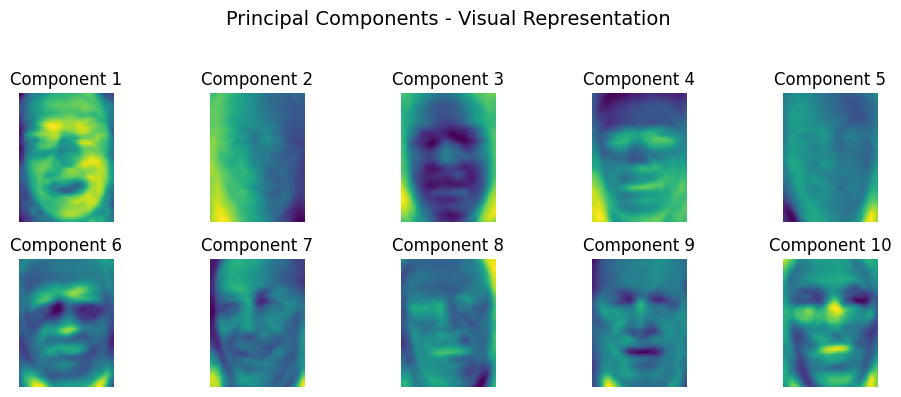

In [11]:
# Print the shape of pca.components_
print("Shape of pca.components_:", pca.components_.shape)

# Visualize the principal components
fig, axes = plt.subplots(2, 5, figsize=(10, 4))
for i, ax in enumerate(axes.flat):
    ax.imshow(pca.components_[i].reshape((50, 37)), cmap='viridis')
    ax.axis('off')
    ax.set_title(f"Component {i+1}")

plt.suptitle("Principal Components - Visual Representation", fontsize=14)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

While we may not fully comprehend all aspects of these components, we can make educated guesses about the facial features and attributes they may capture. For instance, the first component seems to primarily encode the contrast between the face and the background, emphasizing the distinction between the two. The second component, on the other hand, captures differences in lighting between the right and left sides of the face. As we delve into higher-order components, they may capture even more subtle and intricate details of the facial images.

Although this representation derived from PCA is slightly more meaningful than the raw pixel values, it still falls short of how humans perceive and interpret faces. The PCA model, being based on pixels, heavily relies on the alignment of facial features (such as eyes, chin, and nose) and the impact of lighting conditions. Consequently, the similarity between two images is predominantly influenced by these factors in the pixel representation. However, it is crucial to acknowledge that these factors are not the primary aspects humans consider when perceiving faces.

When we ask individuals to assess the similarity of faces, they are more inclined to focus on attributes like age, gender, facial expression, and hairstyle. These attributes are complex and challenging to infer solely from pixel intensities. It is important to note that algorithms often interpret data, especially visual data such as images, quite differently from how humans do. Humans possess rich prior knowledge and contextual understanding that aids in their interpretation, whereas algorithms primarily rely on statistical patterns and pixel-level information.

As we explore the realm of computer vision and image analysis, it is essential to recognize the limitations and differences in how algorithms process and perceive visual data compared to human perception. Striking a balance between algorithmic interpretation and human interpretation is a fascinating and ongoing pursuit in the field, aiming to bridge the gap between artificial intelligence and human understanding.

## Unsupervised Learning - Clustering

### Determining the optimal number of clusters

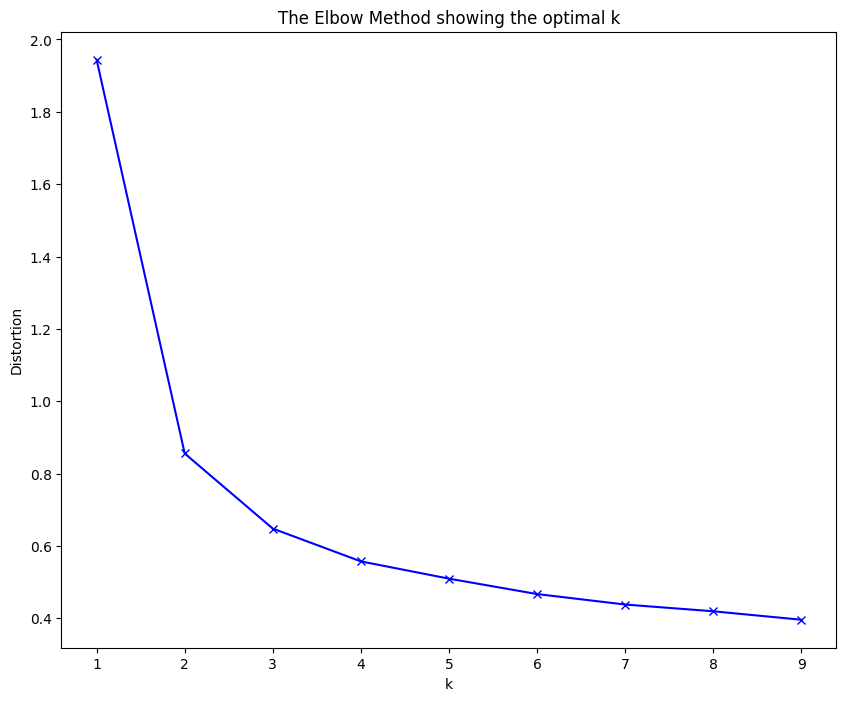

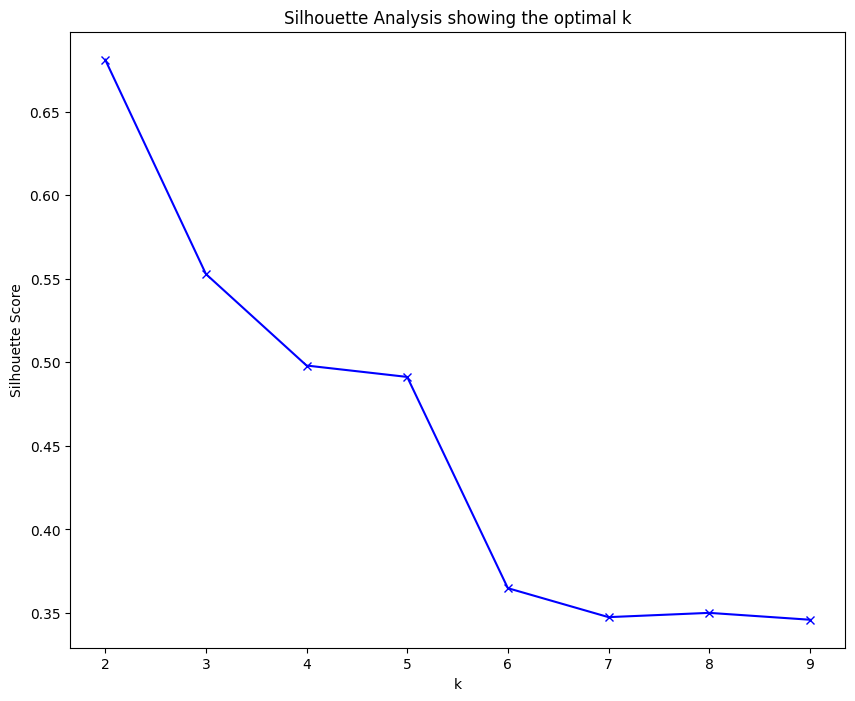

In [12]:
from sklearn.cluster import KMeans
from sklearn.datasets import load_iris
from sklearn.metrics import silhouette_score
from scipy.spatial.distance import cdist
import numpy as np
import matplotlib.pyplot as plt

# load the iris dataset
iris = load_iris()
X = iris.data

# Elbow Method
distortions = []
K = range(1,10)
for k in K:
    kmeanModel = KMeans(n_clusters=k, n_init=10)
    kmeanModel.fit(X)
    distortions.append(sum(np.min(cdist(X, kmeanModel.cluster_centers_, 'euclidean'), axis=1)) / X.shape[0])

# Plot the elbow
plt.figure(figsize=(10,8))
plt.plot(K, distortions, 'bx-')
plt.xlabel('k')
plt.ylabel('Distortion')
plt.title('The Elbow Method showing the optimal k')
plt.show()

# Silhouette Analysis
sil = []
K = range(2,10)  # Silhouette Coefficient is only defined if number of labels is 2 <= n_labels <= n_samples - 1
for k in K:
  kmeans = KMeans(n_clusters = k, n_init=10).fit(X)
  labels = kmeans.labels_
  sil.append(silhouette_score(X, labels, metric = 'euclidean'))

# Plot Silhouette Analysis
plt.figure(figsize=(10,8))
plt.plot(K, sil, 'bx-')
plt.xlabel('k')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Analysis showing the optimal k')
plt.show()

# Gap Statistic Method
# There's no built-in implementation of the Gap Statistic in sklearn, 
# so it's a bit more complex to implement and may require other packages like gapstat_rs.


When you have plotted the distortion and silhouette score against the number of clusters (`k`), you're looking for specific patterns or points in these plots to help identify the optimal number of clusters.

**Elbow Method**

The plot for the Elbow method should ideally have a clear 'elbow'-like bend, where the rate of decrease significantly slows beyond a certain point. This point represents the optimal number of clusters according to the Elbow method. The x-coordinate of this point (i.e., the number of clusters) is the value that you're looking for. 

However, real-world data may not always present a distinct 'elbow'. In such cases, the choice isn't as clear-cut and may require further analysis or domain knowledge to make a good decision.

**Silhouette Analysis**

The Silhouette graph is a useful way to assess the quality of your clustering, providing a visual and quantitative measure of how well each object lies within its cluster.

The silhouette coefficient is a measure of how similar an object is to its own cluster (cohesion) compared to other clusters (separation). The silhouette coefficient ranges from -1 to +1. When the coefficient is high (close to +1), it means the object is well-matched to its own cluster and poorly matched to neighbouring clusters. If most objects have a high value, then the clustering configuration is considered appropriate.

On the contrary, a low silhouette coefficient (around 0) indicates that the object is near the decision boundary for two neighbouring clusters. A negative value indicates that those samples might have been assigned to the wrong cluster, as a different cluster is more similar.

The silhouette plot displays a measure of how close each point in one cluster is to the points in the neighbouring clusters.

Fluctuation in size: Large fluctuations in the size of the silhouette plots can be a clear indication of a problematic clustering.
In an ideal scenario, the silhouette plot of each cluster would be above the overall average score (red-dashed line), and the width of the plot would be consistent, suggesting that the cluster configuration is appropriate.

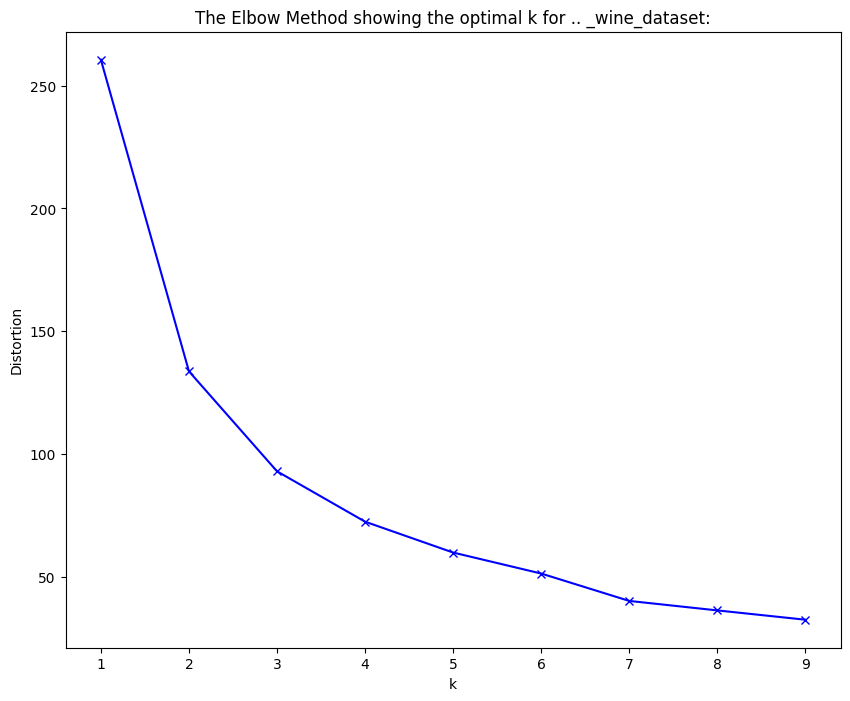

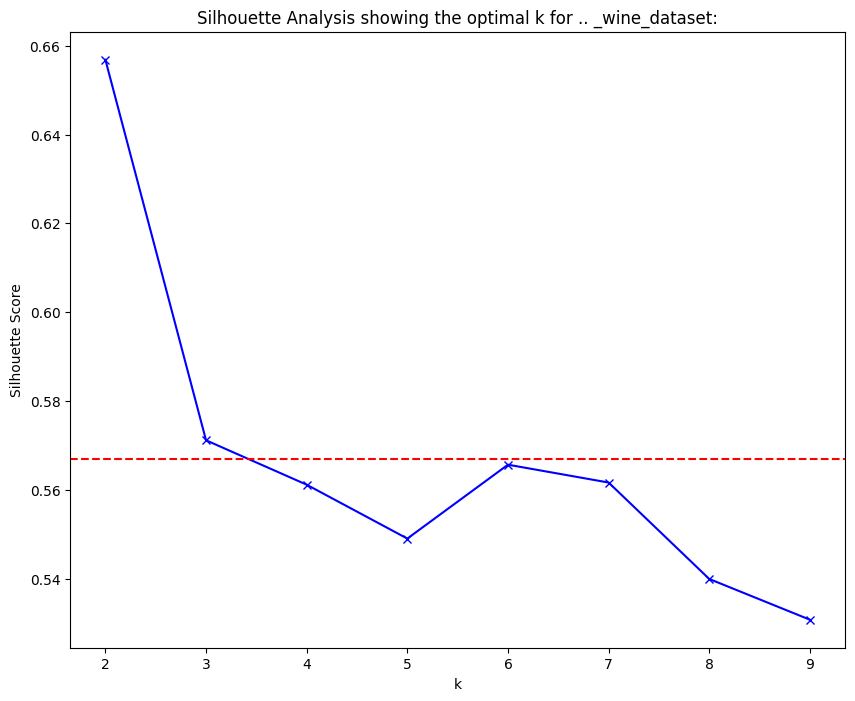

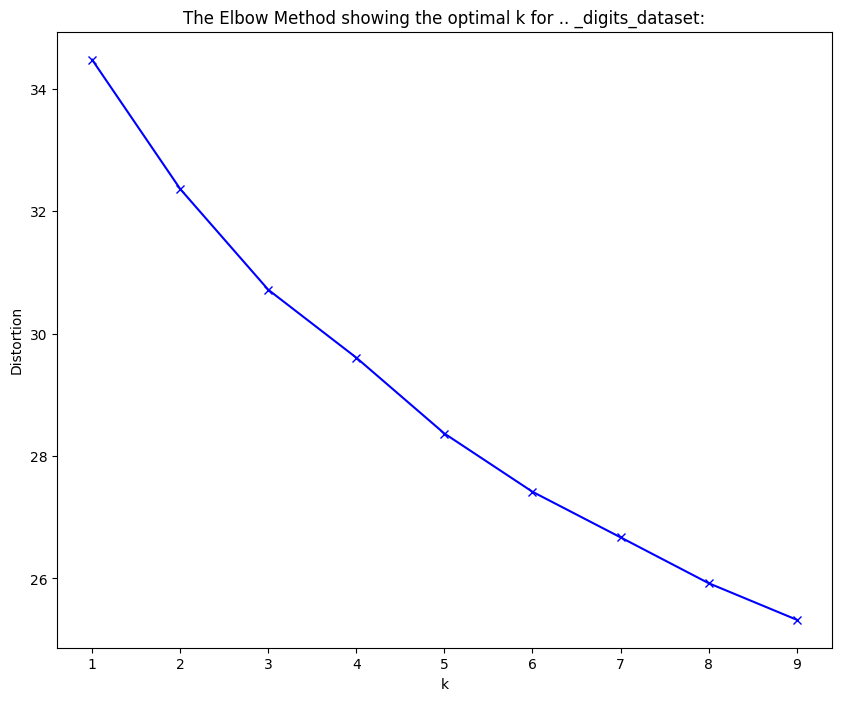

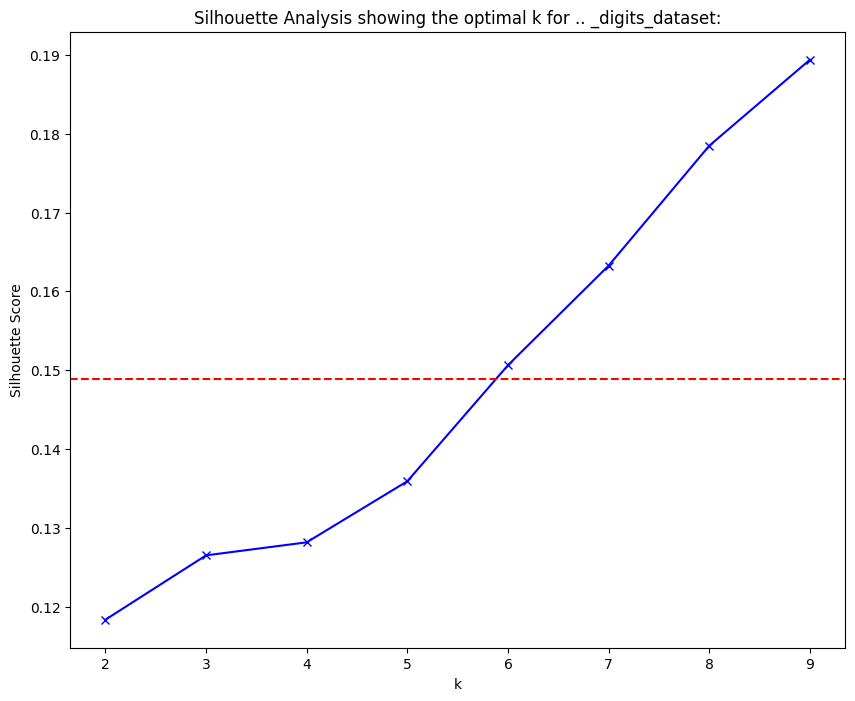

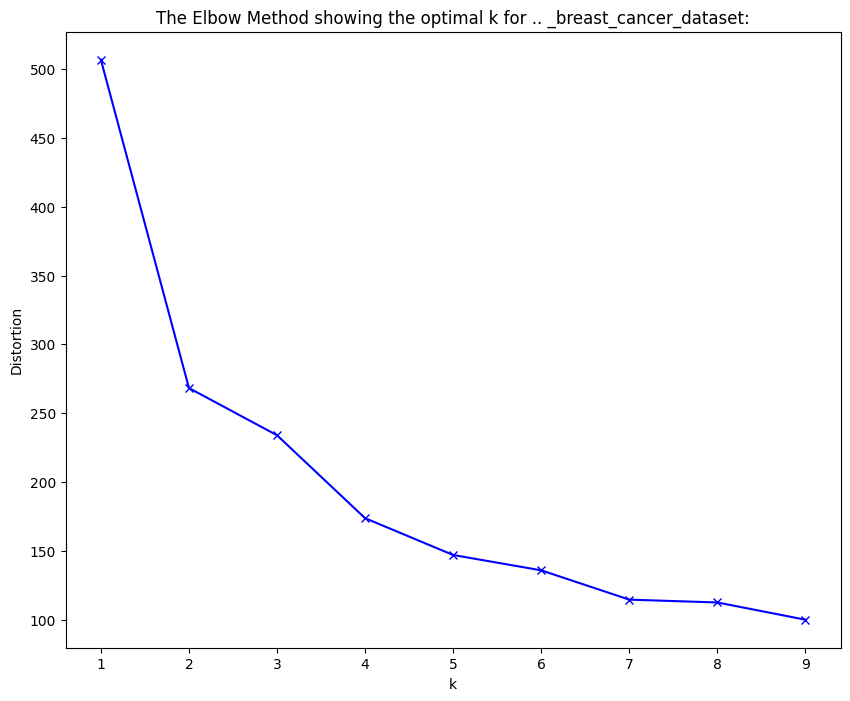

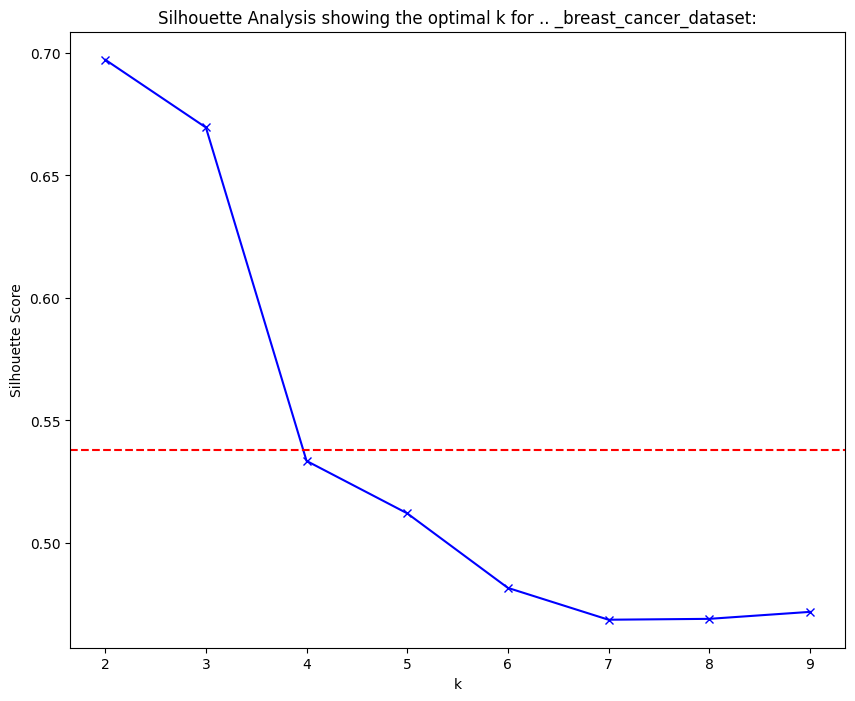

In [13]:
from sklearn.cluster import KMeans
from sklearn.datasets import load_wine, load_digits, load_breast_cancer
from sklearn.metrics import silhouette_score
from scipy.spatial.distance import cdist
import numpy as np
import matplotlib.pyplot as plt

datasets = [load_wine(), load_digits(), load_breast_cancer()]

for dataset in datasets:
    X = dataset.data
    
    # Elbow Method
    distortions = []
    K = range(1,10)
    for k in K:
        kmeanModel = KMeans(n_clusters=k, n_init=10)
        kmeanModel.fit(X)
        distortions.append(sum(np.min(cdist(X, kmeanModel.cluster_centers_, 'euclidean'), axis=1)) / X.shape[0])
    
    # Plot the elbow
    plt.figure(figsize=(10,8))
    plt.plot(K, distortions, 'bx-')
    plt.xlabel('k')
    plt.ylabel('Distortion')
    plt.title('The Elbow Method showing the optimal k for {}'.format(dataset.DESCR.split('\n')[0]))
    plt.show()
    
    # Silhouette Analysis
    sil = []
    K = range(2,10)  # Silhouette Coefficient is only defined if number of labels is 2 <= n_labels <= n_samples - 1
    for k in K:
        kmeans = KMeans(n_clusters = k, n_init=10).fit(X)
        labels = kmeans.labels_
        sil.append(silhouette_score(X, labels, metric = 'euclidean'))

    # Plot Silhouette Analysis
    plt.figure(figsize=(10,8))
    plt.plot(K, sil, 'bx-')
    plt.xlabel('k')
    plt.ylabel('Silhouette Score')
    plt.title('Silhouette Analysis showing the optimal k for {}'.format(dataset.DESCR.split('\n')[0]))

    # Add the average silhouette score as a red dashed line
    avg_sil = sum(sil) / len(sil)
    plt.axhline(y=avg_sil, color='red', linestyle='--')

    plt.show()



### k-Means clustering

#### Algorithm Visualisation - k-Means Clustering

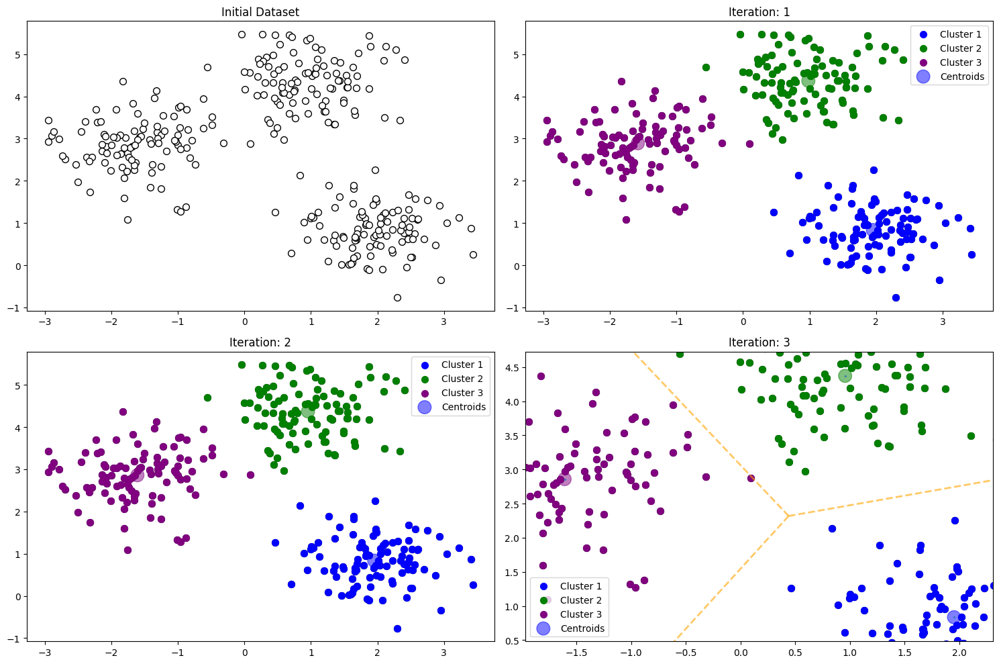

In [14]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.datasets import make_blobs
from sklearn.cluster import KMeans
from scipy.spatial import Voronoi, voronoi_plot_2d

# create synthetic dataset
np.random.seed(0)
X, y = make_blobs(n_samples=300, centers=3, random_state=0, cluster_std=0.60)

fig, axs = plt.subplots(2, 2, figsize=(15, 10))
colors = ['blue', 'green', 'purple']

# visualize dataset
axs[0, 0].scatter(X[:, 0], X[:, 1], s=50, color='white', edgecolors='black')
axs[0, 0].set_title("Initial Dataset")

# function to plot kmeans steps
def plot_kmeans(kmeans, X, n_iter, ax, final=False):
    kmeans.fit(X)
    labels = kmeans.predict(X)
    # plot the input data
    ax.scatter(X[:, 0], X[:, 1], c='white', s=50, edgecolors='black')

    # Plot points assigned to each cluster
    for cluster in np.unique(labels):
        ax.scatter(X[labels == cluster, 0], X[labels == cluster, 1], color=colors[cluster], label=f'Cluster {cluster+1}', s=50)

    # plot the representation of the k-means model
    centers = kmeans.cluster_centers_
    ax.scatter(centers[:, 0], centers[:, 1], c=colors, s=200, alpha=0.5, label='Centroids');
    
    ax.set_title(f"Iteration: {n_iter+1}")

    if final:
        vor = Voronoi(centers)
        voronoi_plot_2d(vor, ax=ax, show_vertices=False, line_colors='orange', line_width=2, line_alpha=0.6, point_size=2)

    ax.legend()

# plot three iterations of k-means
for i in range(3):
    row = (i+1) // 2
    col = (i+1) % 2
    kmeans = KMeans(n_clusters=3, init='random', n_init=1, max_iter=(i+1), random_state=6)
    plot_kmeans(kmeans, X, i, axs[row, col], final=(i == 2))

plt.tight_layout()
plt.show()


#### Applying k-Means clustering

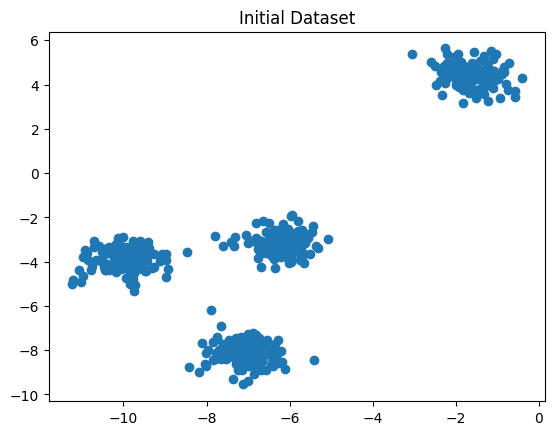

Cluster memberships:
[0 0 2 1 3 1 3 3 2 3 0 0 3 1 3 0 2 0 1 3 2 2 3 1 3 3 1 1 2 3 0 1 3 0 3 0 2
 2 0 2 3 2 1 3 3 0 2 3 1 1 1 2 2 3 0 2 2 2 2 3 1 1 2 3 1 3 0 3 2 2 0 2 3 0
 3 3 0 3 3 2 1 1 2 1 1 2 2 1 2 2 1 0 2 3 1 0 0 3 0 1 1 0 1 2 1 3 3 1 1 2 3
 0 1 2 1 2 1 3 1 3 2 0 0 2 3 2 1 0 0 3 1 2 2 2 2 0 1 3 1 1 3 0 3 1 1 1 3 3
 0 0 2 2 1 0 1 2 2 2 2 2 2 2 2 2 1 0 0 0 3 1 0 2 3 0 1 2 2 2 2 0 3 2 1 0 0
 2 3 0 0 3 1 1 0 0 3 1 3 0 0 1 0 2 1 3 3 0 3 2 0 3 2 3 2 0 3 3 3 1 2 1 3 0
 2 3 2 2 2 1 3 1 0 2 0 2 1 1 2 0 1 0 3 2 0 0 0 0 3 2 0 2 3 1 1 3 3 1 2 3 2
 1 3 1 2 2 1 3 0 0 2 2 2 3 1 1 3 1 2 0 1 0 1 0 0 1 0 1 1 3 2 2 2 3 3 3 0 1
 0 2 0 3 0 3 0 2 0 0 2 0 0 2 1 0 3 3 1 1 3 0 1 1 3 0 1 1 3 2 1 2 3 0 0 1 2
 0 3 1 1 3 3 2 0 3 1 1 2 1 1 1 1 0 0 3 1 2 3 0 1 2 1 3 1 2 3 2 1 3 3 0 1 0
 0 0 0 0 0 2 0 1 0 1 1 2 1 3 2 0 0 1 2 1 3 0 3 2 0 2 2 1 1 0 2 3 1 3 3 0 0
 3 0 2 2 0 2 0 2 1 0 1 2 3 1 2 3 1 0 3 1 1 2 3 2 3 0 1 0 3 1 0 0 0 2 1 3 0
 3 3 2 2 0 3 3 3 3 3 3 0 3 2 0 3 1 3 1 3 2 3 1 1 1 2 3 2 0 2 1 3 0 1 0 1 0
 3 1

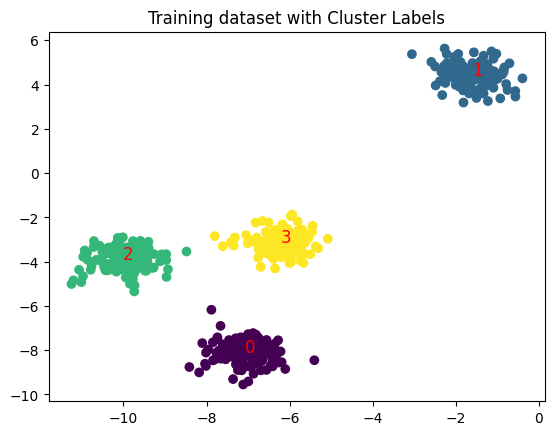

Predicted cluster memberships:
[0 0 2 1 3 1 3 3 2 3 0 0 3 1 3 0 2 0 1 3 2 2 3 1 3 3 1 1 2 3 0 1 3 0 3 0 2
 2 0 2 3 2 1 3 3 0 2 3 1 1 1 2 2 3 0 2 2 2 2 3 1 1 2 3 1 3 0 3 2 2 0 2 3 0
 3 3 0 3 3 2 1 1 2 1 1 2 2 1 2 2 1 0 2 3 1 0 0 3 0 1 1 0 1 2 1 3 3 1 1 2 3
 0 1 2 1 2 1 3 1 3 2 0 0 2 3 2 1 0 0 3 1 2 2 2 2 0 1 3 1 1 3 0 3 1 1 1 3 3
 0 0 2 2 1 0 1 2 2 2 2 2 2 2 2 2 1 0 0 0 3 1 0 2 3 0 1 2 2 2 2 0 3 2 1 0 0
 2 3 0 0 3 1 1 0 0 3 1 3 0 0 1 0 2 1 3 3 0 3 2 0 3 2 3 2 0 3 3 3 1 2 1 3 0
 2 3 2 2 2 1 3 1 0 2 0 2 1 1 2 0 1 0 3 2 0 0 0 0 3 2 0 2 3 1 1 3 3 1 2 3 2
 1 3 1 2 2 1 3 0 0 2 2 2 3 1 1 3 1 2 0 1 0 1 0 0 1 0 1 1 3 2 2 2 3 3 3 0 1
 0 2 0 3 0 3 0 2 0 0 2 0 0 2 1 0 3 3 1 1 3 0 1 1 3 0 1 1 3 2 1 2 3 0 0 1 2
 0 3 1 1 3 3 2 0 3 1 1 2 1 1 1 1 0 0 3 1 2 3 0 1 2 1 3 1 2 3 2 1 3 3 0 1 0
 0 0 0 0 0 2 0 1 0 1 1 2 1 3 2 0 0 1 2 1 3 0 3 2 0 2 2 1 1 0 2 3 1 3 3 0 0
 3 0 2 2 0 2 0 2 1 0 1 2 3 1 2 3 1 0 3 1 1 2 3 2 3 0 1 0 3 1 0 0 0 2 1 3 0
 3 3 2 2 0 3 3 3 3 3 3 0 3 2 0 3 1 3 1 3 2 3 1 1 1 2 3 2 0 2 1 3 0 1 

In [15]:
# Import necessary libraries
import matplotlib.pyplot as plt
from sklearn.datasets import make_blobs
from sklearn.cluster import KMeans

# Generate a synthetic dataset
# make_blobs() generates synthetic data in groups (or 'blobs'), which is perfect for our example.
X, y = make_blobs(n_samples=500, centers=4, random_state=1, cluster_std=0.5)

# Visualize the synthetic dataset
plt.scatter(X[:, 0], X[:, 1])
plt.title("Initial Dataset")
plt.show()

# Instantiate KMeans
# We specify the number of clusters we're expecting (4 in this case).
# random_state ensures reproducibility.
kmeans = KMeans(n_clusters=4, random_state=1, n_init=10)

# Fit the model to the data
# This is where KMeans does its job and finds the clusters in the data.
kmeans.fit(X)

# During the algorithm, each training data point in X is assigned a cluster label. You can find these labels in the kmeans.labels_ attribute:
print("Cluster memberships:\n{}".format(kmeans.labels_))

# Visualize the fitted data
# Each cluster is represented by a different color.
# The red texts represent the cluster centers (or 'centroids').
plt.scatter(X[:, 0], X[:, 1], c=kmeans.labels_)
plt.title("Training dataset with Cluster Labels")
for i, center in enumerate(kmeans.cluster_centers_):
    plt.text(center[0], center[1], str(i), fontsize=12, color='red')
plt.show()

# You can also assign cluster labels to new points, using the predict method. Each new point is assigned to the closest cluster center when predicting, but the existing model is not changed. Running predict on the training set returns the same result as labels_:
print("Predicted cluster memberships:\n{}".format(kmeans.predict(X)))


#### Failure cases of k-means

**Understanding Clustering: Labels and Ground Truth**

Clustering, similar to classification, involves assigning labels to data points. However, unlike classification, clustering is an unsupervised learning task, meaning there is no ground truth or predefined labels. As a consequence, the assigned labels have no inherent meaning before examining the data.

Let's revisit the example of clustering face images that we discussed earlier. When clustering faces, the algorithm provides clusters without any preconceived notion of what each cluster represents. For instance, if the algorithm labels a group of faces as "Cluster 3," it does not imply any specific characteristic or identity associated with that label. We can only understand the meaning of each cluster by visually inspecting the images within them.

**Arbitrariness of Cluster Numbers**

The number of clusters is determined beforehand, often denoted as "k" in k-means clustering. However, the choice of "k" can be somewhat arbitrary, and different values of "k" may lead to different interpretations of the data. For example, if we apply k-means clustering to a two-dimensional toy dataset and obtain two clusters labeled 0 and 1, these labels themselves do not carry inherent significance.

The randomness involved in the initialization step of the k-means algorithm can also influence the cluster numbering. Running the algorithm multiple times may result in different cluster assignments due to this random initialization.

**Iterative Nature of Clustering**

To summarize, clustering is a data exploration technique that helps identify patterns and groups within data. It does not provide predefined meanings for the clusters, and the number of clusters (k) should be chosen based on the nature of the problem or the desired level of granularity. The iterative nature of clustering algorithms ensures that the clusters are refined at each step, leading to a more accurate representation of underlying patterns within the data.

While K-Means can be an effective clustering algorithm, its performance can sometimes diverge from expectations. For instance, consider a scenario where a dataset has three distinct, dense regions: one each at the lower left, upper right, and the center. Given that K-Means tends to stretch its clusters to reach towards the center, the clusters assigned to the lower left and upper right may also include points from the center, which intuitively belong to a separate cluster.

Moreover, K-Means presumes equal importance for all directions within each cluster. This assumption becomes a limitation when dealing with data that has distinct clusters elongated along a specific direction, as K-Means only takes into account the distance to the nearest cluster center.

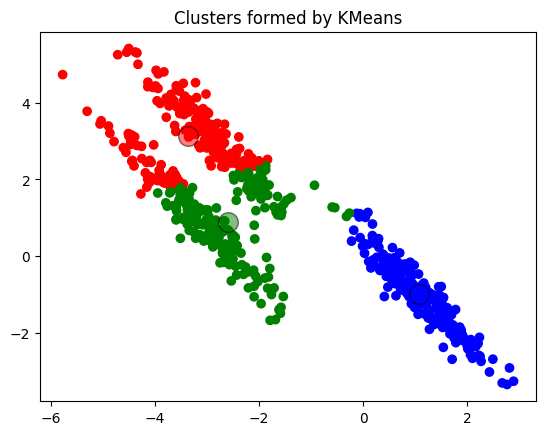

In [16]:
import numpy as np
from sklearn.datasets import make_blobs
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

# Generate synthetic data
X, y = make_blobs(random_state=170, n_samples=600)
rng = np.random.RandomState(74)

# Transform the data to be stretched
transformation = rng.normal(size=(2, 2))
X = np.dot(X, transformation)

# Cluster the data into three clusters
kmeans = KMeans(n_clusters=3, n_init=10)
kmeans.fit(X)
y_pred = kmeans.predict(X)

# Define colors for clusters and centroids
colors = ['blue', 'green', 'red']

# Plot the data and the clusters
plt.scatter(X[:, 0], X[:, 1], c=[colors[label] for label in y_pred])

# Plot the centroids with corresponding cluster colors and black border
for i, center in enumerate(kmeans.cluster_centers_):
    plt.scatter(center[0], center[1], marker='o', alpha=0.5, s=200, edgecolor='black', linewidths=1, color=colors[i])

plt.title("Clusters formed by KMeans")
plt.show()


One might have expected the dense region in the lower left to be the first cluster, the dense region in the upper right to be the second, and the less dense region in the center to be the third. Instead, both cluster 0 and cluster 1 have some points that are far away from all the other points in these clusters that “reach” toward the center.

The K-Means algorithm may perform poorly with complex shapes, such as the "two moons" dataset. This is due to the fact that K-Means uses a distance measure that creates hyper-spherical clusters, which can be inappropriate for data with complex geometries.

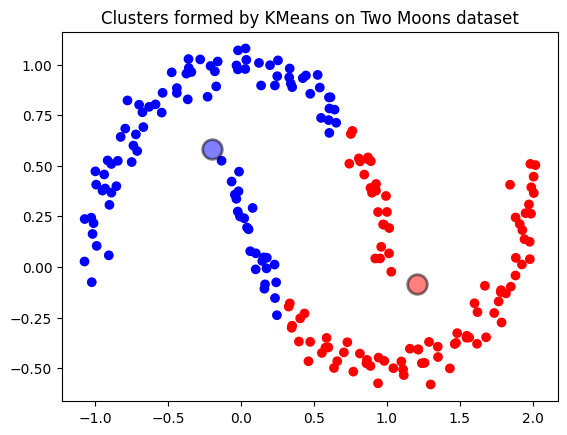

In [17]:
from sklearn.datasets import make_moons
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

# Generate two_moons synthetic data
X, y = make_moons(n_samples=200, noise=0.05, random_state=0)

# Cluster the data into two clusters
kmeans = KMeans(n_clusters=2, n_init=10)
kmeans.fit(X)
y_pred = kmeans.predict(X)

# Define colors for clusters and centroids
colors = ['blue', 'red']

# Plot the data and the clusters
plt.scatter(X[:, 0], X[:, 1], c=[colors[label] for label in y_pred])

# Plot the centroids with corresponding cluster colors and black border
for i, center in enumerate(kmeans.cluster_centers_):
    plt.scatter(center[0], center[1], marker='o', alpha=0.5, s=200, edgecolor='black', linewidths=2, color=colors[i])

plt.title("Clusters formed by KMeans on Two Moons dataset")
plt.show()


The clustering algorithm can't discover the two half-moon shapes. This kind of shapes are not possible to be discovered using the k-means algorithm.

#### Vector Quantization

**The Connection between k-Means and PCA**

While k-means is primarily known as a clustering algorithm, it exhibits intriguing similarities to decomposition methods like PCA (Principal Component Analysis). PCA aims to discover the directions of maximum variance in the data and represents data points as a sum over some components. On the other hand, k-means seeks to represent each data point using a cluster center. This perspective of k-means as a decomposition method, where each point is represented by a single component, is termed "vector quantization."

**Vector Quantization and k-Means**

An interesting aspect of vector quantization using k-means is its capability to employ more clusters than input dimensions to encode our data. Let's consider the example of the two_moons dataset. With PCA, there is limited flexibility as the data resides in only two dimensions. Reducing it to one dimension with PCA would result in the loss of important structural information. However, k-means allows us to achieve a more expressive representation by utilizing additional cluster centers:

/var/folders/93/rr5y78td6j9gwbgxnl17cjq00000gn/T/ipykernel_63377/1446974327.py:27: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = plt.cm.get_cmap('viridis', 10)


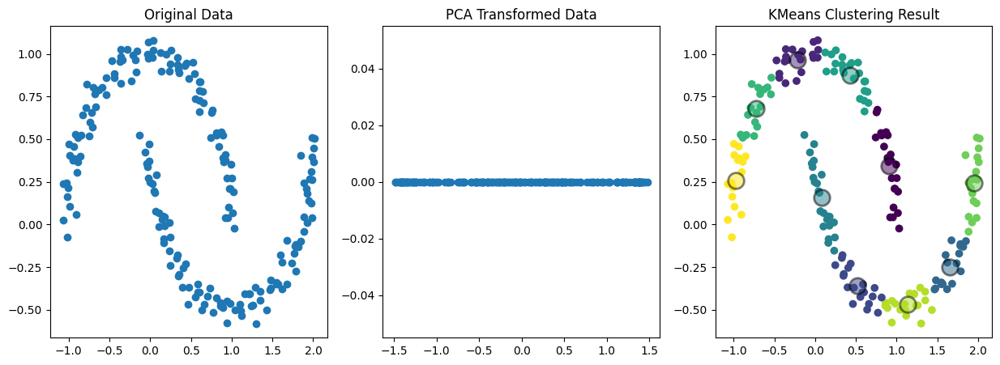

In [18]:
from sklearn.datasets import make_moons
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

# Generate two_moons synthetic data
X, y = make_moons(n_samples=200, noise=0.05, random_state=0)

# Perform PCA with 1 component
pca = PCA(n_components=1)
X_pca = pca.fit_transform(X)

# Perform KMeans with 10 clusters (more than the number of dimensions)
kmeans = KMeans(n_clusters=10, n_init=10)
kmeans.fit(X)
y_pred = kmeans.predict(X)

# Plot original data, PCA transformed data and KMeans clustering result
fig, axes = plt.subplots(1, 3, figsize=(15, 5))

axes[0].scatter(X[:, 0], X[:, 1])
axes[0].set_title("Original Data")

axes[1].scatter(X_pca, [0]*len(X_pca))
axes[1].set_title("PCA Transformed Data")

colors = plt.cm.get_cmap('viridis', 10)
axes[2].scatter(X[:, 0], X[:, 1], c=y_pred, cmap=colors)

# Plot the centroids with corresponding cluster colors, black border, size 200 and semi-transparency
for i, center in enumerate(kmeans.cluster_centers_):
    axes[2].scatter(center[0], center[1], marker='o', s=200, edgecolor='black', linewidths=2, color=colors(i), alpha=0.5)
    
axes[2].set_title("KMeans Clustering Result")

plt.show()


**Enhanced Data Separation with k-Means**

With the enhanced representation obtained through k-means vector quantization, we have expanded our possibilities for data separation and analysis. Previously, the two half-moon shapes in the dataset were not easily separable using a linear model with only the original two features. 

**Distance-Based Features**

In addition to achieving better separability, we can further enrich the data representation by leveraging the distances to each of the cluster centers as features. This exciting possibility can be realized using the `transform` method of k-means:

By incorporating the distances to the cluster centers as new features, we create a more expressive and higher-dimensional representation of the data. These additional features can capture intricate patterns and relationships that were previously hidden in the original dataset. As a result, this enriched representation equips us with powerful insights and facilitates the application of advanced machine learning techniques for more accurate predictions and analyses.

In [19]:
distance_features = kmeans.transform(X)
print("Distance feature shape: {}".format(distance_features.shape))
print("Distance features:\n{}".format(distance_features))

Distance feature shape: (200, 10)
Distance features:
[[0.20114577 1.12484411 0.9285066  ... 1.16559918 1.04013486 1.80791793]
 [1.0130603  2.27569325 1.0972352  ... 0.70700803 0.4935202  2.66814112]
 [0.9321221  0.71910707 0.83342655 ... 1.97061341 1.37288227 0.95077955]
 ...
 [0.81176801 1.04915948 0.49304961 ... 1.79125448 1.06309851 1.17816482]
 [1.0283524  0.34346911 1.42316347 ... 1.97788956 1.78881986 1.32756232]
 [0.91038932 2.189235   1.10826107 ... 0.57163262 0.54671574 2.63792601]]


#### Agglomerative Clustering

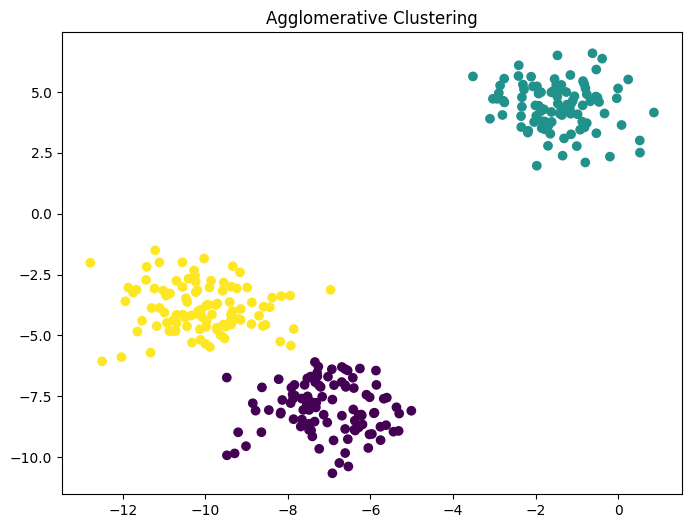

In [20]:
from sklearn.datasets import make_blobs
from sklearn.cluster import AgglomerativeClustering
import matplotlib.pyplot as plt

# Generate synthetic dataset with 3 clusters
X, y = make_blobs(random_state=1, n_samples=300, centers=3)

# Define Agglomerative Clustering model
agg = AgglomerativeClustering(n_clusters=3)

# Fit the model and predict the cluster memberships simultaneously
# This is because agglomerative clustering doesn't have a separate predict method
labels = agg.fit_predict(X)

# Now, let's visualise the clusters
plt.figure(figsize=(8, 6))
plt.scatter(X[:, 0], X[:, 1], c=labels, cmap='viridis')
plt.title("Agglomerative Clustering")
plt.show()

The algorithm retrieves the clusters perfectly. Now let's test it with the two moons dataset.

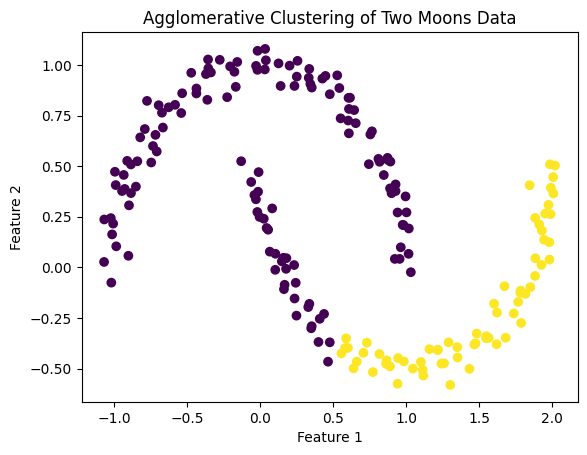

In [21]:
from sklearn.datasets import make_moons
from sklearn.cluster import AgglomerativeClustering
import matplotlib.pyplot as plt

# Generate two_moons synthetic data
X, y = make_moons(n_samples=200, noise=0.05, random_state=0)

# Cluster the data into two clusters
agg = AgglomerativeClustering(n_clusters=2)

# Fit the model and predict the cluster memberships simultaneously
labels = agg.fit_predict(X)

# Now we create a scatter plot of the clustering
plt.scatter(X[:, 0], X[:, 1], c=labels, cmap='viridis')

# Label the axes and show the plot
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.title('Agglomerative Clustering of Two Moons Data')
plt.show()

The agglomerative clustering algorithm demonstrates a subpar performance on the 'two moons' dataset, primarily due to its inherent structure. The dataset consists of two interlocked half-moon shapes, a configuration that poses a challenge for this algorithm. The essence of agglomerative clustering lies in its ability to build hierarchical clusters by successively merging or splitting existing groups. 

However, it struggles with 'non-globular' shapes and complex spatial structures such as the two half-moon shapes in this dataset. The reason is that it operates based on local decisions—either merging or splitting clusters—without considering the broader dataset structure. Consequently, this leads to its inability to correctly identify and separate the two distinctive half-moon shapes in the dataset.

##### Hierarchical Clustering and Dendrograms

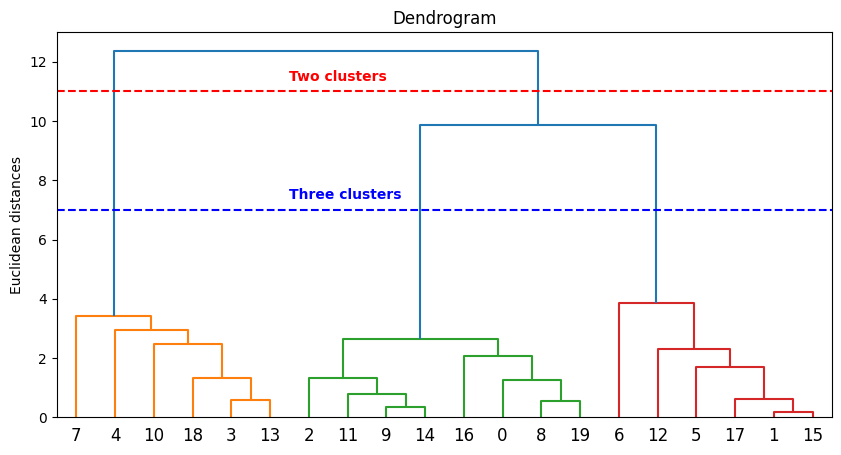

In [22]:
# Import necessary libraries
from sklearn.datasets import make_blobs
from scipy.cluster.hierarchy import dendrogram, linkage
from matplotlib import pyplot as plt

# Generate a dataset with 3 clusters, each having 4 features
X, y = make_blobs(n_samples=20, n_features=2, centers=3, random_state=0)

# Compute the linkage array - this computes the hierarchical clustering
# 'ward' is one method of clustering - it minimizes the variance of the clusters being merged
# You can experiment with 'single', 'complete', 'average', and 'centroid' too.
Z = linkage(X, 'ward')

# Now we are ready to plot the dendrogram
fig = plt.figure(figsize=(10, 5))  # set the size of the figure

# Create a dendrogram
dn = dendrogram(Z)

plt.title('Dendrogram')  # title of the plot
plt.ylabel('Euclidean distances')  # label the y-axis

# Add horizontal lines to indicate the cut-off for two clusters
# We are choosing 15 and 10 arbitrarily. Ideally, you would base this on an understanding of your dataset
plt.axhline(y=11, color='r', linestyle='--')

# Add horizontal lines to indicate the cut-off for three clusters
plt.axhline(y=7, color='b', linestyle='--')

# Add annotation text
plt.text(60, 11.5, 'Two clusters', color='r', va='center', fontweight='bold')
plt.text(60, 7.5, 'Three clusters', color='b', va='center', fontweight='bold')

plt.show()


A dendrogram is a tree-like diagram that visualises the process of hierarchical clustering. It can sometimes appear complex, but once you understand its structure, it's a powerful tool for interpreting your data. Here's a guide on how to read it:

1. **Starting from the Bottom**: The leaves at the bottom of the tree represent individual data points. Each vertical line is a cluster (at different levels), initially treating each data point as a single-cluster.

2. **Height of the Lines**: The height of each vertical line represents the distance (dissimilarity) between two clusters that are merged. A longer line signifies a greater distance, implying that less similar clusters are being combined. 

3. **Moving Upwards**: As you move up the tree, vertical lines are linked by horizontal lines, which represent the merging of two clusters. The height of these horizontal lines indicates the distance at which these clusters have been combined. This distance is a measure of the dissimilarity between the two clusters being merged. Thus, lower merges represent more similar clusters, while higher merges suggest more diverse clusters.

4. **Reading the Clusters**: At each height level, you can slice the dendrogram horizontally to define your clusters. For instance, a cut at a lower height will result in more clusters, each containing fewer elements (closer to individual data points). Conversely, a cut at a higher height will result in fewer clusters, each containing more elements (possibly very different from each other).

5. **Colouring and Truncation**: Some dendrograms may use colour to indicate cluster groups or may truncate the tree for readability, showing only the last p merged clusters. The colour threshold in a dendrogram is the distance at which clusters are painted with separate colours. Truncation level indicates the maximum depth of the linkage tree to show.

6. **Annotations**: Annotations like horizontal lines and texts are usually added to help with the visual understanding of the number of clusters formed at certain distances.

Text(0, 0.5, 'Cluster distance')

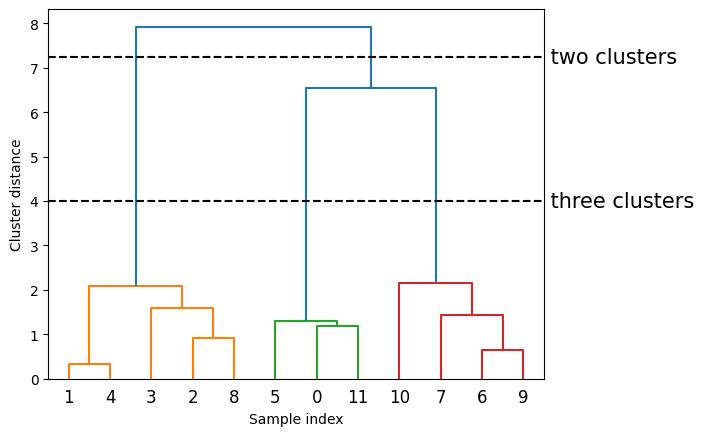

In [23]:
# Import the dendrogram function and the ward clustering function from SciPy
from scipy.cluster.hierarchy import dendrogram, ward

X, y = make_blobs(random_state=0, n_samples=12)
# Apply the ward clustering to the data array X
# The SciPy ward function returns an array that specifies the distances
# bridged when performing agglomerative clustering
linkage_array = ward(X)
# Now we plot the dendrogram for the linkage_array containing the distances
# between clusters
dendrogram(linkage_array)

# mark the cuts in the tree that signify two or three clusters
ax = plt.gca()
bounds = ax.get_xbound()
ax.plot(bounds, [7.25, 7.25], '--', c='k')
ax.plot(bounds, [4, 4], '--', c='k')

ax.text(bounds[1], 7.25, ' two clusters', va='center', fontdict={'size': 15})
ax.text(bounds[1], 4, ' three clusters', va='center', fontdict={'size': 15})
plt.xlabel("Sample index")
plt.ylabel("Cluster distance")

#### DBSCAN

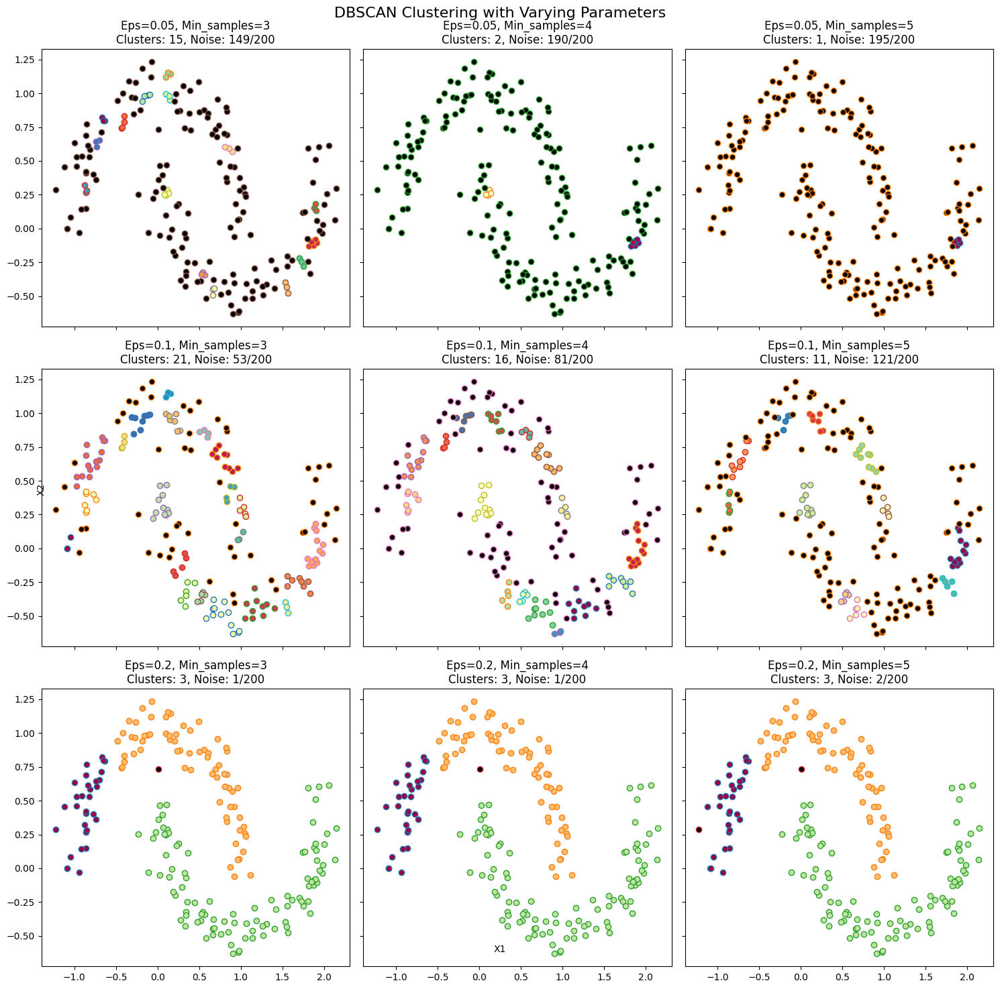

In [24]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.datasets import make_moons
from sklearn.cluster import DBSCAN

# Generate synthetic data (you can replace this with your own dataset)
n_samples = 200
data, _ = make_moons(n_samples=n_samples, noise=0.1, random_state=42)

# Define the range of parameter values to explore (3 values each)
eps_values = [0.05, 0.1, 0.2]
min_samples_values = range(3, 6)  # Assuming range(2, 5) gives [2, 3, 4]

# Create a grid of subplots for the plots (3x3 grid)
fig, axes = plt.subplots(3, 3, figsize=(15, 15), sharex=True, sharey=True)

# Loop through the first 9 combinations of parameter values and plot the results
for i, eps in enumerate(eps_values):
    for j, min_samples in enumerate(min_samples_values):
        if i*3 + j >= 9:
            break

        dbscan = DBSCAN(eps=eps, min_samples=min_samples)
        labels = dbscan.fit_predict(data)

        n_clusters = len(set(labels)) - (1 if -1 in labels else 0)
        n_noise = list(labels).count(-1)

        # Plot the clusters and noise points
        unique_labels = set(labels)
        colors = [plt.cm.Spectral(each) for each in np.linspace(0, 1, len(unique_labels))]
        for k, col in zip(unique_labels, colors):
            if k == -1:
                col = [0, 0, 0, 1]  # Black for noise points
            class_member_mask = (labels == k)
            xy = data[class_member_mask]
            axes[i, j].plot(xy[:, 0], xy[:, 1], 'o', markerfacecolor=tuple(col), markersize=6)

        axes[i, j].set_title("Eps={}, Min_samples={}\nClusters: {}, Noise: {}/{}".format(eps, min_samples, n_clusters, n_noise, n_samples))

# Add axis labels and a title to the entire plot
fig.text(0.5, 0.04, 'X1', ha='center')
fig.text(0.04, 0.5, 'X2', va='center', rotation='vertical')
fig.suptitle("DBSCAN Clustering with Varying Parameters", fontsize=16)

plt.tight_layout()
plt.show()


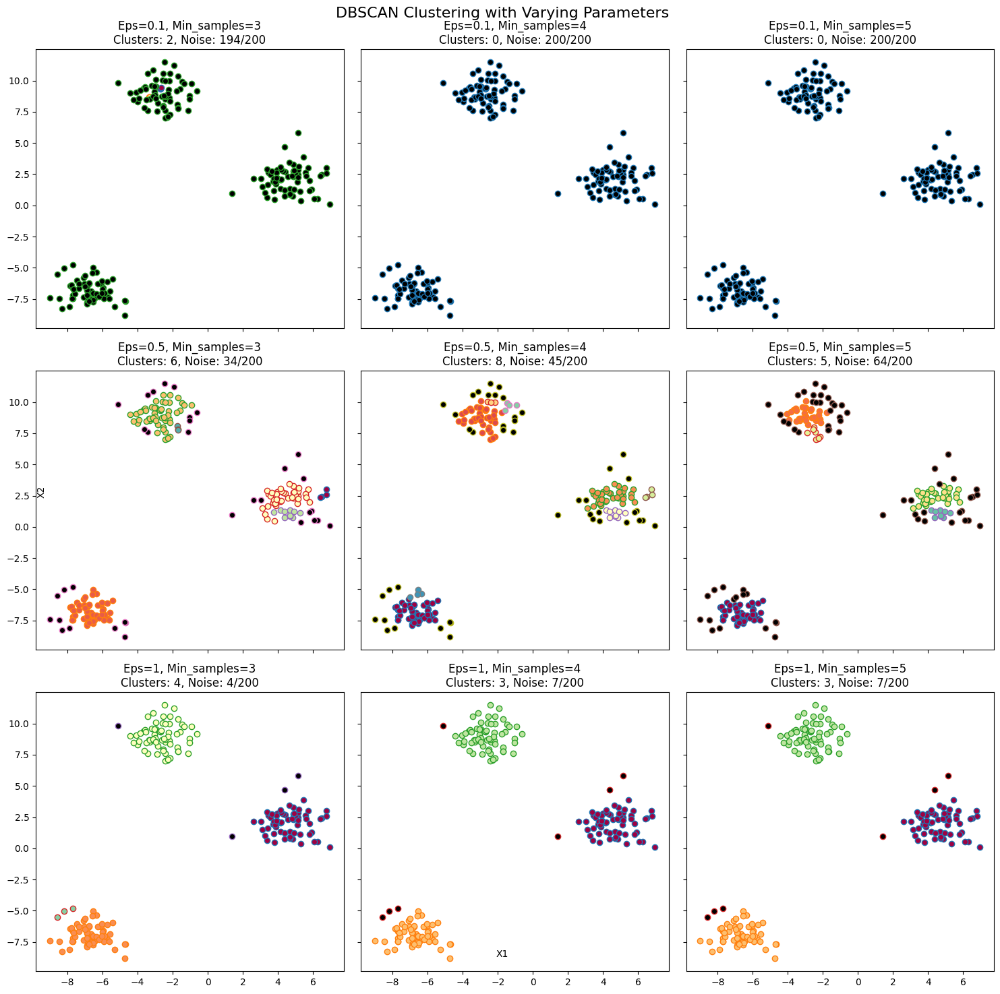

In [25]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.datasets import make_blobs
from sklearn.cluster import DBSCAN

# Generate synthetic data (you can replace this with your own dataset)
n_samples = 200
data, _ = make_blobs(n_samples=n_samples, random_state=42)

# Define the range of parameter values to explore (3 values each)
eps_values = [0.1, 0.5, 1]
min_samples_values = range(3, 6)  # Assuming range(2, 5) gives [2, 3, 4]

# Create a grid of subplots for the plots (3x3 grid)
fig, axes = plt.subplots(3, 3, figsize=(15, 15), sharex=True, sharey=True)

# Loop through the first 9 combinations of parameter values and plot the results
for i, eps in enumerate(eps_values):
    for j, min_samples in enumerate(min_samples_values):
        if i*3 + j >= 9:
            break

        dbscan = DBSCAN(eps=eps, min_samples=min_samples)
        labels = dbscan.fit_predict(data)

        n_clusters = len(set(labels)) - (1 if -1 in labels else 0)
        n_noise = list(labels).count(-1)

        # Plot the clusters and noise points
        unique_labels = set(labels)
        colors = [plt.cm.Spectral(each) for each in np.linspace(0, 1, len(unique_labels))]
        for k, col in zip(unique_labels, colors):
            if k == -1:
                col = [0, 0, 0, 1]  # Black for noise points
            class_member_mask = (labels == k)
            xy = data[class_member_mask]
            axes[i, j].plot(xy[:, 0], xy[:, 1], 'o', markerfacecolor=tuple(col), markersize=6)

        axes[i, j].set_title("Eps={}, Min_samples={}\nClusters: {}, Noise: {}/{}".format(eps, min_samples, n_clusters, n_noise, n_samples))

# Add axis labels and a title to the entire plot
fig.text(0.5, 0.04, 'X1', ha='center')
fig.text(0.04, 0.5, 'X2', va='center', rotation='vertical')
fig.suptitle("DBSCAN Clustering with Varying Parameters", fontsize=16)

plt.tight_layout()
plt.show()


1. The code explores the behavior of the DBSCAN algorithm by varying two important parameters: `eps` (neighborhood distance) and `min_samples` (minimum number of points in a neighborhood).

2. The code generates synthetic moon-shaped data with added noise using scikit-learn's `make_moons` function. The data contains 200 samples.

3. It defines a range of parameter values to explore: `eps_values` and `min_samples_values`. For `eps`, it generates three equally spaced values between 0.1 and 0.5. For `min_samples`, it takes values [2, 3, 4].

4. The code creates a 3x3 grid of subplots using matplotlib, where each subplot will show the clusters and noise points obtained for a specific combination of `eps` and `min_samples`.

5. It loops through the parameter combinations and fits the DBSCAN model to the synthetic data for each combination of `eps` and `min_samples`.

6. For each combination, the code computes the cluster labels and the number of clusters and noise points.

7. The clusters and noise points are then plotted on the corresponding subplot in the grid. Clusters are represented by colored markers, while noise points are shown as black markers. The size of the markers indicates whether the points are core samples or boundary points.

8. The code adds titles to each subplot, displaying the values of `eps`, `min_samples`, the number of clusters, and the number of noise points for the specific combination.

9. The resulting plot showcases the behavior of the DBSCAN algorithm for different combinations of `eps` and `min_samples`. It illustrates how the choice of these parameters affects the clustering outcome, cluster sizes, and noise points.

#### Comparing and evaluating clustering algorithms

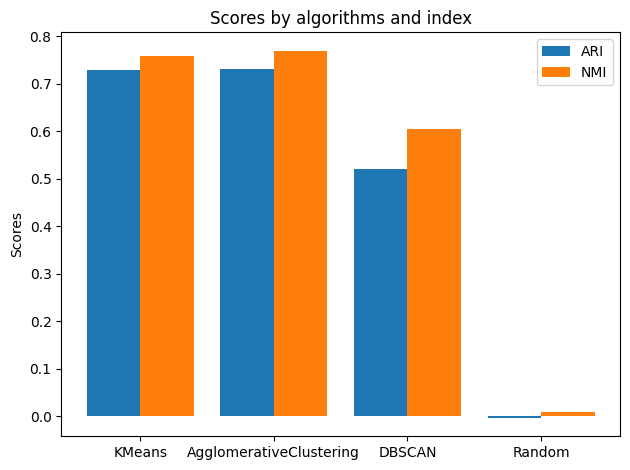

In [26]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn import datasets
from sklearn.cluster import KMeans, AgglomerativeClustering, DBSCAN
from sklearn.metrics.cluster import adjusted_rand_score, normalized_mutual_info_score
from sklearn.utils import check_random_state

# Load the iris dataset
iris = datasets.load_iris()
X = iris.data
y = iris.target

# Define the algorithms
algorithms = [
    ('KMeans', KMeans(n_clusters=3, n_init=10)),
    ('AgglomerativeClustering', AgglomerativeClustering(n_clusters=3)),
    ('DBSCAN', DBSCAN(eps=0.5))
]

# Initialize list to store scores
ari_scores = []
nmi_scores = []

# Random state for reproducibility
rng = check_random_state(0)

# Compute random assignment labels
random_labels = rng.permutation(y)

# Compute the ARI and NMI for random assignments
ari_random = adjusted_rand_score(y, random_labels)
nmi_random = normalized_mutual_info_score(y, random_labels)

# Iterate over algorithms
for name, algorithm in algorithms:
    # Predict the clusters
    y_pred = algorithm.fit_predict(X)

    # Compute the ARI
    ari = adjusted_rand_score(y, y_pred)
    ari_scores.append(ari)

    # Compute the NMI
    nmi = normalized_mutual_info_score(y, y_pred)
    nmi_scores.append(nmi)

# Plotting
labels = [name for name, _ in algorithms]
labels.append('Random')
x = np.arange(len(labels))

fig, ax = plt.subplots()
rects1 = ax.bar(x - 0.2, ari_scores+[ari_random], 0.4, label='ARI')
rects2 = ax.bar(x + 0.2, nmi_scores+[nmi_random], 0.4, label='NMI')

# Add some text for labels, title and custom x-axis tick labels
ax.set_ylabel('Scores')
ax.set_title('Scores by algorithms and index')
ax.set_xticks(x)
ax.set_xticklabels(labels)
ax.legend()

fig.tight_layout()
plt.show()


### Comparing algorithms on the faces dataset

**OPTIONAL**

Let's engage the K-means, DBSCAN, and agglomerative clustering algorithms with the 'Labeled Faces in the Wild' dataset to explore any intriguing structures they might uncover.

We'll utilise the eigenface representation of the data, generated by Principal Component Analysis (PCA) with the whiten=True parameter and 100 components:

In [27]:
from sklearn.datasets import fetch_lfw_people
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans, AgglomerativeClustering, DBSCAN

# Load the Labeled Faces in the Wild dataset
lfw_people = fetch_lfw_people(min_faces_per_person=50, resize=0.4)

# Apply PCA with 100 components
pca = PCA(n_components=150, whiten=True)
X_pca = pca.fit_transform(lfw_people.data)

Previously, we discovered that this representation encapsulates a more semantic understanding of the face images in comparison to the raw pixels. Moreover, it accelerates the computational process.

#### Analyzing the faces dataset with DBSCAN

In [28]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.datasets import fetch_lfw_people
from sklearn.decomposition import PCA
from sklearn.cluster import DBSCAN, AgglomerativeClustering

# Loading the faces dataset
people = fetch_lfw_people(min_faces_per_person=20, resize=0.7)
X_people = people.data
y_people = people.target
image_shape = people.images[0].shape

# Normalizing the data
X_people = X_people / 255.

# Perform PCA for dimensionality reduction
pca = PCA(n_components=100, whiten=True, random_state=42)
X_pca = pca.fit_transform(X_people)

# apply DBSCAN with default parameters
dbscan = DBSCAN()
labels = dbscan.fit_predict(X_pca)
print("Unique labels: {}".format(np.unique(labels)))

Unique labels: [-1]


We see that all the returned labels are –1, so all of the data was labeled as “noise” by DBSCAN. There are two things we can change to help this: we can make eps higher, to expand the neighborhood of each point, and set min_samples lower, to consider smaller groups of points as clusters. Let’s try changing min_samples first:

In [29]:
dbscan = DBSCAN(min_samples=3)
labels = dbscan.fit_predict(X_pca)
print("Unique labels: {}".format(np.unique(labels)))

Unique labels: [-1]


Even when considering groups of three points, everything is labeled as noise. So, we need to increase eps:

In [30]:
dbscan = DBSCAN(min_samples=3, eps=15)
labels = dbscan.fit_predict(X_pca)
print("Unique labels: {}".format(np.unique(labels)))

Unique labels: [-1  0]


Using a much larger eps of 15, we get only a single cluster and noise points. We can use this result to find out what the “noise” looks like compared to the rest of the data.

To understand better what’s happening, let’s look at how many points are noise, and how many points are inside the cluster

In [31]:
# count number of points in all clusters and noise.
# bincount doesn't allow negative numbers, so we need to add 1.
# the first number in the result corresponds to noise points
print("Number of points per cluster: {}".format(np.bincount(labels + 1)))

Number of points per cluster: [  44 2979]


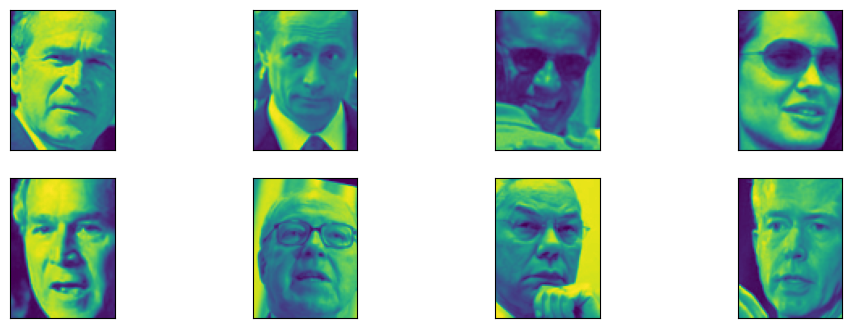

In [32]:
noise = X_people[labels==-1]

fig, axes = plt.subplots(2, 4, subplot_kw={'xticks': (), 'yticks': ()},
                         figsize=(12, 4))
for image, ax in zip(noise, axes.ravel()):
    ax.imshow(image.reshape(image_shape))

Comparing these images to the random sample of face images gathered in [76], it is possible to guess why they were labeled as noise: all of them have something strange (poses, objects)

This kind of analysis—trying to find “the odd one out”—is called outlier detection. If this was a real application, we might try to do a better job of cropping images, to get more homogeneous data. There is little we can do about people in photos sometimes wearing hats, drinking, or holding something in front of their faces, but it’s good to know that these are issues in the data that any algorithm we might apply needs to handle.
If we want to find more interesting clusters than just one large one, we need to set eps smaller, somewhere between 15 and 0.5 (the default). Let’s have a look at what different values of eps result in:

In [33]:
for eps in [1, 3, 5, 7, 9, 11]:
    print("\neps={}".format(eps))
    dbscan = DBSCAN(eps=eps, min_samples=3)
    labels = dbscan.fit_predict(X_pca)
    print("Number of clusters: {}".format(len(np.unique(labels))))
    print("Cluster sizes: {}".format(np.bincount(labels + 1)))
    print("Clusters present: {}".format(np.unique(labels)))


eps=1
Number of clusters: 1
Cluster sizes: [3023]
Clusters present: [-1]

eps=3
Number of clusters: 1
Cluster sizes: [3023]
Clusters present: [-1]

eps=5
Number of clusters: 1
Cluster sizes: [3023]
Clusters present: [-1]

eps=7
Number of clusters: 14
Cluster sizes: [2799  175    3    3   10    4    4    5    3    5    3    3    3    3]
Clusters present: [-1  0  1  2  3  4  5  6  7  8  9 10 11 12]

eps=9
Number of clusters: 5
Cluster sizes: [1618 1396    3    3    3]
Clusters present: [-1  0  1  2  3]

eps=11
Number of clusters: 2
Cluster sizes: [ 539 2484]
Clusters present: [-1  0]


For low settings of eps, all points are labeled as noise. Starting from eps 5 we get some noise points and many smaller clusters. For eps=11 we still get many noise points, but we get one big cluster and some smaller clusters. 

What is interesting to note is that there is never more than one large cluster. At most, there is one large cluster containing most of the points, and some smaller clusters. This indicates that there are not two or three different kinds of face images in the data that are very distinct, but rather that all images are more or less equally similar to (or dissimilar from) the rest.

To visualise a the cluster for a determined eps and min_values:

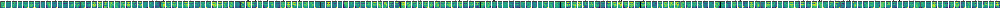

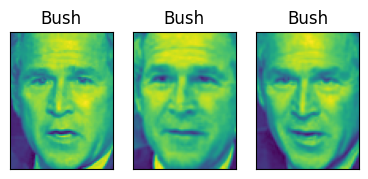

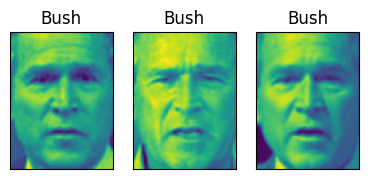

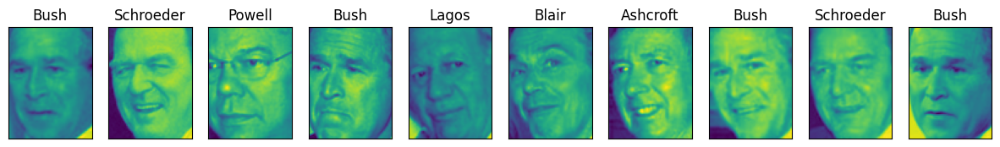

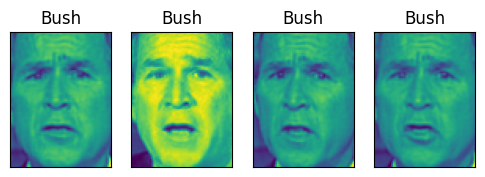

...

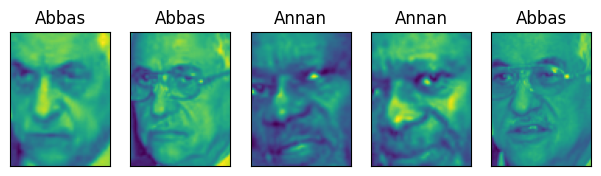

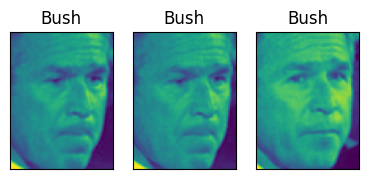

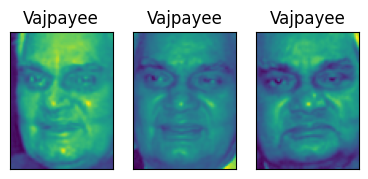

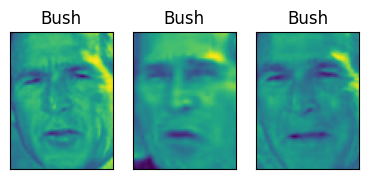

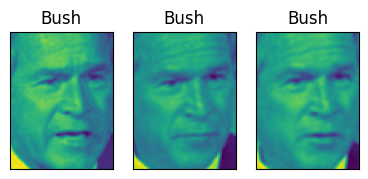

In [34]:
dbscan = DBSCAN(min_samples=3, eps=7)
labels = dbscan.fit_predict(X_pca)

for cluster in range(max(labels) + 1):
    mask = labels == cluster
    n_images =  np.sum(mask)
    fig, axes = plt.subplots(1, n_images, figsize=(n_images * 1.5, 4),
                             subplot_kw={'xticks': (), 'yticks': ()})
    for image, label, ax in zip(X_people[mask], y_people[mask], axes):

        ax.imshow(image.reshape(image_shape))
        ax.set_title(people.target_names[label].split()[-1])

Some of the clusters correspond to similar orientation and expressions.

This concludes our analysis of the DBSCAN algorithm applied to the faces dataset. As
you can see, we are doing a manual analysis here, different from the much more automatic
search approach we could use for supervised learning based on R2 score or
accuracy.
Let’s move on to applying k-means and agglomerative clustering

##### Analyzing the faces dataset with k-Means

We saw that it was not possible to create
more than one big cluster using DBSCAN. Agglomerative clustering and k-means are
much more likely to create clusters of even size, but we do need to set a target number
of clusters. We could set the number of clusters to the known number of people in
the dataset, though it is very unlikely that an unsupervised clustering algorithm will
recover them. Instead, we can start with a low number of clusters, like 10, which
might allow us to analyze each of the clusters:

In [35]:
# extract clusters with k-Means
km = KMeans(n_clusters=10, n_init=10, random_state=0)
labels_km = km.fit_predict(X_pca)
print("Cluster sizes k-means: {}".format(np.bincount(labels_km)))

Cluster sizes k-means: [308 339 289 281 241 173 426 209 585 172]


This is quite different from the result of DBSCAN. We can further analyze the outcome of k-means by visualizing the cluster centers. As we clustered in the representation produced by PCA, we need to rotate the cluster centers back into the original space to visualize them, using pca.inverse_transform:

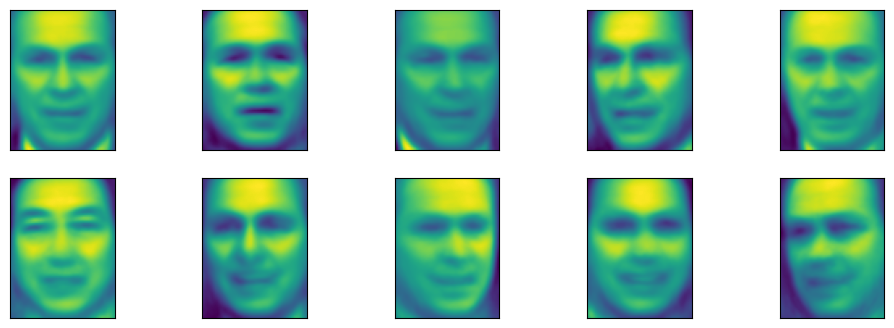

In [36]:
fig, axes = plt.subplots(2, 5, subplot_kw={'xticks': (), 'yticks': ()},
                         figsize=(12, 4))
for center, ax in zip(km.cluster_centers_, axes.ravel()):
    ax.imshow(pca.inverse_transform(center).reshape(image_shape))

The cluster centers found by k-means are very smooth versions of faces. This is not very surprising, given that each center is an average of many face images. Working with a reduced PCA representation adds to the smoothness of the images. The clustering seems to pick up on different orientations of the face, different expressions (the third
cluster center seems to show a smiling face), and the presence of shirt collars (see the second-to-last cluster center). 

##### Analyzing the faces dataset with agglomerative clustering

In [37]:
# extract clusters with ward agglomerative clustering
agglomerative = AgglomerativeClustering(n_clusters=10)
labels_agg = agglomerative.fit_predict(X_pca)
print("cluster sizes agglomerative clustering: {}".format(
       np.bincount(labels_agg)))

cluster sizes agglomerative clustering: [251 305 343 968 108  42 497 188  73 248]


These are more uneven than those produced by k-means, but much more even than the ones produced by DBSCAN. We can compute the ARI to measure whether the two partitions of the data given by agglomerative clustering and k-means are similar:

In [38]:
print("ARI: {:.2f}".format(adjusted_rand_score(labels_agg, labels_km)))

ARI: 0.07


This low ARI means that the two clusterings labels_agg and labels_km have little in common. This is not very surprising, given the fact that points further away from the cluster centers seem to have little in common for k-means. Next, we might want to plot the dendrogram. We’ll limit the depth of the tree in the plot, as branching down to the individual 2,063 data points would result in an unreadably dense plot:

Text(0, 0.5, 'Cluster distance')

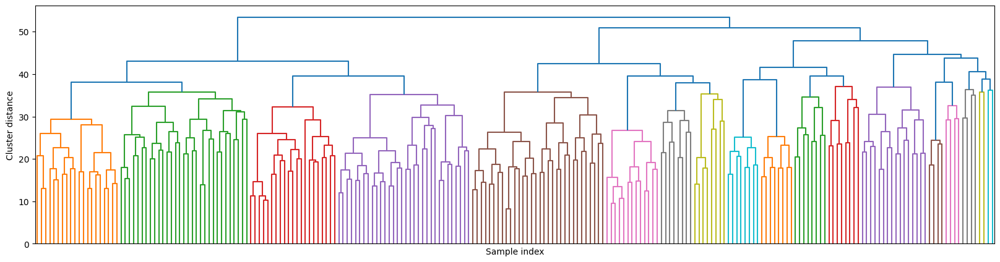

In [39]:
linkage_array = ward(X_pca)
# now we plot the dendrogram for the linkage_array
# containing the distances between clusters
plt.figure(figsize=(20, 5))
dendrogram(linkage_array, p=7, truncate_mode='level', no_labels=True)
plt.xlabel("Sample index")
plt.ylabel("Cluster distance")

For the faces data, there doesn’t seem to be a very natural cutoff point. There are some branches that represent more distinct groups, but there doesn’t appear to be a particular number of clusters that is a good fit. This is not surprising, given the results
of DBSCAN, which tried to cluster all points together.

Let’s visualize the 10 clusters, as we did for k-means earlier (Figure 3-46). Note that there is no notion of cluster center in agglomerative clustering (though we could compute the mean), and we simply show the first couple of points in each cluster. We show the number of points in each cluster to the left of the first image:

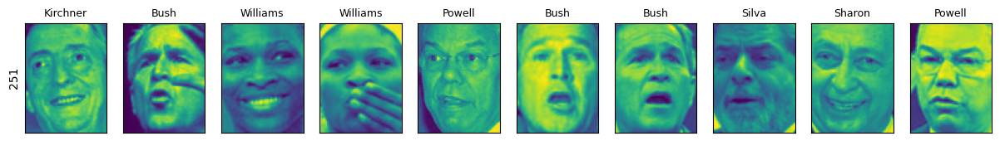

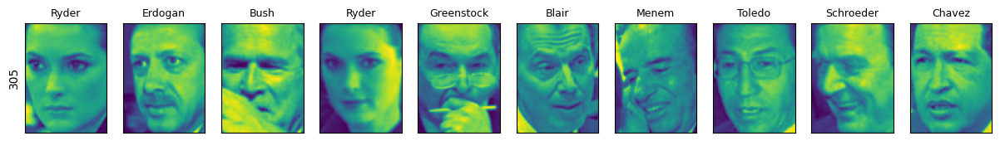

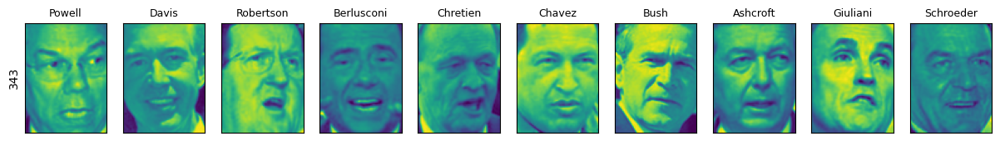

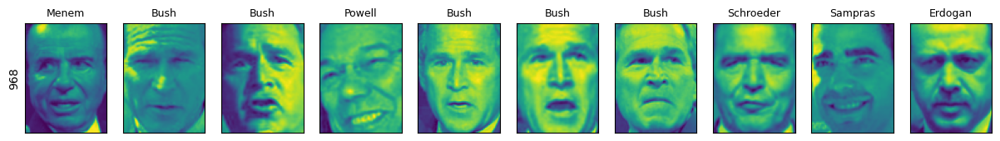

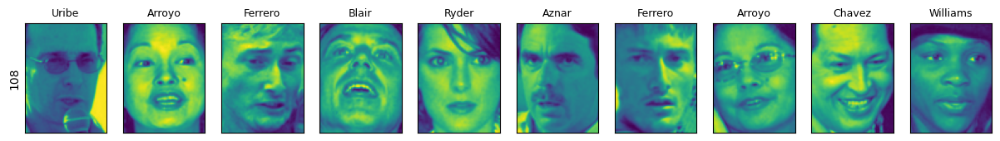

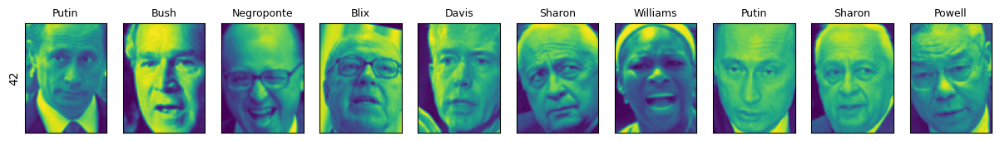

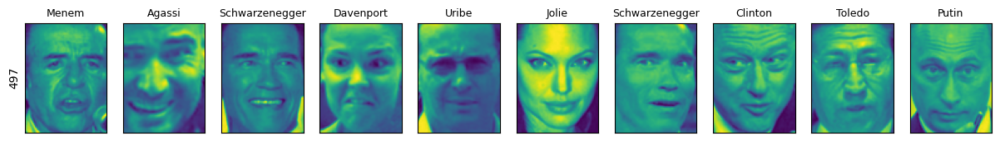

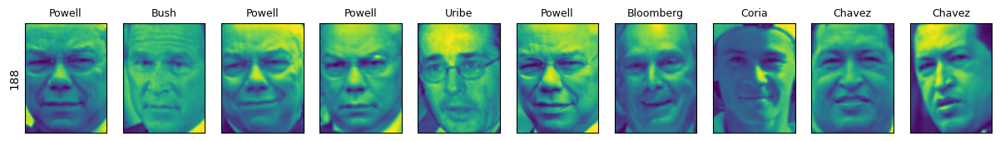

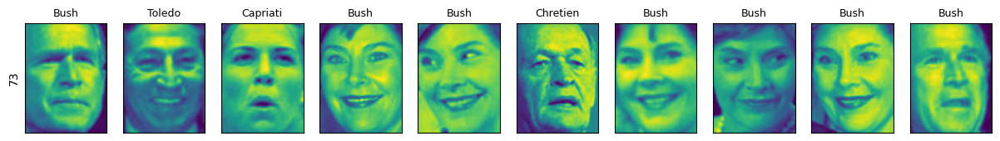

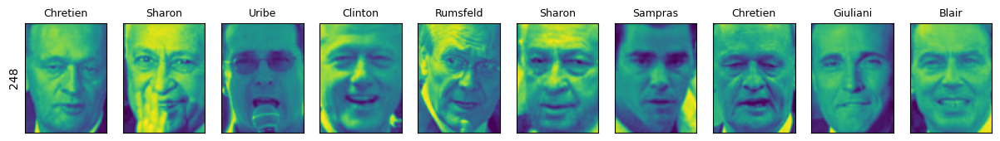

In [40]:
n_clusters = 10
for cluster in range(n_clusters):
    mask = labels_agg == cluster
    fig, axes = plt.subplots(1, 10, subplot_kw={'xticks': (), 'yticks': ()},
                             figsize=(15, 8))
    axes[0].set_ylabel(np.sum(mask))
    for image, label, asdf, ax in zip(X_people[mask], y_people[mask],
                                      labels_agg[mask], axes):
        ax.imshow(image.reshape(image_shape))
        ax.set_title(people.target_names[label].split()[-1],
                     fontdict={'fontsize': 9})

While some of the clusters seem to have a semantic theme, many of them are too
large to be actually homogeneous. To get more homogeneous clusters, we can run the
algorithm again, this time with 40 clusters, and pick out some of the clusters that are
particularly interesting

cluster sizes agglomerative clustering: [ 67  87  22  57 137  71 351  10  65 151  33  48  33  75  69  50  53 269
   7  51  88  58  32 238  63  31  72  32  80  41  35  25  54  43 144  27
 160  19  45  30]


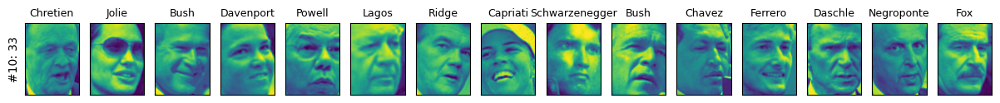

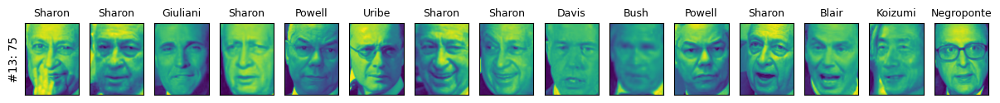

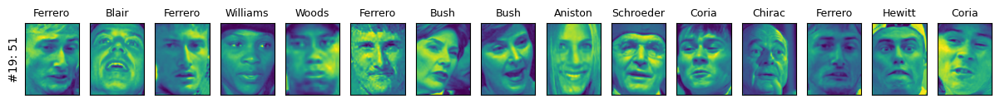

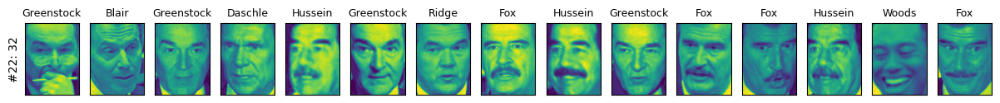

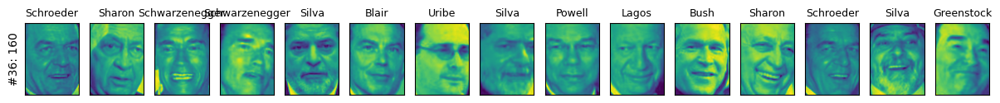

In [41]:
# extract clusters with ward agglomerative clustering
agglomerative = AgglomerativeClustering(n_clusters=40)
labels_agg = agglomerative.fit_predict(X_pca)
print("cluster sizes agglomerative clustering: {}".format(np.bincount(labels_agg)))

n_clusters = 40
for cluster in [10, 13, 19, 22, 36]: # hand-picked "interesting" clusters
    mask = labels_agg == cluster
    fig, axes = plt.subplots(1, 15, subplot_kw={'xticks': (), 'yticks': ()},
                             figsize=(15, 8))
    cluster_size = np.sum(mask)
    axes[0].set_ylabel("#{}: {}".format(cluster, cluster_size))
    for image, label, asdf, ax in zip(X_people[mask], y_people[mask],
                                      labels_agg[mask], axes):
        ax.imshow(image.reshape(image_shape))
        ax.set_title(people.target_names[label].split()[-1],
                     fontdict={'fontsize': 9})
    for i in range(cluster_size, 15):
        axes[i].set_visible(False)

### Gaussian Mixture Models

### Gaussian Mixture Models (GMM): Theory and Implementation

#### Overview
A Gaussian Mixture Model (GMM) is a probabilistic model that assumes data points are generated from a mixture of several Gaussian distributions. 

#### Key Steps in GMM

##### 1. Model Initialization
- **Number of Components (k)**: Define how many Gaussian distributions to use
- **Initial Parameters**:
  - Mean vectors (μ) for each component
  - Covariance matrices (Σ) for each component
  - Mixing coefficients (π) representing cluster weights

##### 2. Expectation-Maximization (EM) Algorithm
The EM algorithm iteratively refines the model parameters through two steps:

###### E-Step (Expectation)
- Calculate responsibilities (γᵢⱼ): The probability that each data point i belongs to component j
- Uses current parameter estimates to compute membership probabilities

###### M-Step (Maximization)
- Update model parameters using the calculated responsibilities:
  - Recompute means (μ)
  - Update covariances (Σ)
  - Adjust mixing coefficients (π)

##### 3. Convergence
- Iterate E and M steps until either:
  - Parameters stabilize (changes below threshold)
  - Maximum iterations reached
  - Log-likelihood converges

##### 4. Final Clustering
- Assign each data point to the component with highest probability
- Output final cluster assignments and model parameters


/var/folders/93/rr5y78td6j9gwbgxnl17cjq00000gn/T/ipykernel_63377/1575369073.py:10: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  plt.scatter(X[:, 0], X[:, 1], s=30, cmap='viridis')


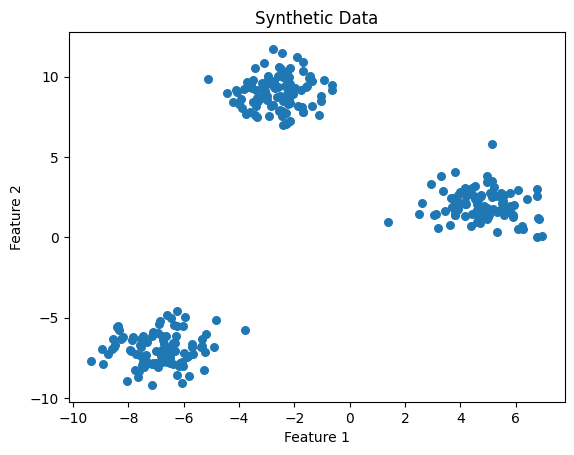

In [42]:

import numpy as np
import matplotlib.pyplot as plt
from sklearn.datasets import make_blobs

# Generate synthetic data
np.random.seed(42)
X, y_true = make_blobs(n_samples=300, centers=3, cluster_std=1.0)

# Visualize the data
plt.scatter(X[:, 0], X[:, 1], s=30, cmap='viridis')
plt.title('Synthetic Data')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.show()


### Visualization

Our dataset contains three clusters. However, we’ll proceed without using the true labels (`y_true`), as GMM is an unsupervised algorithm.

#### Initializing GMM Parameters

We need to set:
- **Number of Clusters (k)**: Let’s set `k = 3`.
- **Initial Parameters**: We can initialize the parameters randomly or use another method like KMeans for better starting points.

We’ll use the KMeans algorithm for initialization.

In [43]:

from sklearn.cluster import KMeans

# Initialize means using KMeans
k = 3
kmeans = KMeans(n_clusters=k, random_state=42)
kmeans.fit(X)
initial_means = kmeans.cluster_centers_

# Initialize covariances and mixing coefficients
initial_covariances = [np.cov(X.T) for _ in range(k)]
initial_weights = np.full(k, 1 / k)  # Equal weights initially

print("Initial Means:\n", initial_means)
print("Initial Weights:\n", initial_weights)


Initial Means:
 [[-2.63323268  9.04356978]
 [-6.88387179 -6.98398415]
 [ 4.74710337  2.01059427]]
Initial Weights:
 [0.33333333 0.33333333 0.33333333]


### Step 2: The Expectation-Maximization (EM) Algorithm

#### Explanation

The EM algorithm iteratively improves the GMM parameters. It consists of two main steps:

1. **Expectation Step (E-step)**:
   - Calculate the responsibility (γᵢⱼ) that each Gaussian component j has for each data point i.
   - The responsibility is the probability that data point i was generated by component j, given the current parameters.

2. **Maximization Step (M-step)**:
   - Update the parameters (μ, Σ, π) using the responsibilities computed in the E-step.
   - This step maximizes the expected log-likelihood with respect to the parameters.

#### Mathematical Formulation

- **E-step**: Compute responsibilities
  \[
  \gamma_{ij} = \frac{\pi_j \mathcal{N}(x_i | \mu_j, \Sigma_j)}{\sum_{k=1}^{K} \pi_k \mathcal{N}(x_i | \mu_k, \Sigma_k)}
  \]

- **M-step**: Update parameters
  \[
  \mu_j = \frac{\sum_{i=1}^{N} \gamma_{ij} x_i}{\sum_{i=1}^{N} \gamma_{ij}}
  \]
  \[
  \Sigma_j = \frac{\sum_{i=1}^{N} \gamma_{ij} (x_i - \mu_j)(x_i - \mu_j)^T}{\sum_{i=1}^{N} \gamma_{ij}}
  \]
  \[
  \pi_j = \frac{\sum_{i=1}^{N} \gamma_{ij}}{N}
  \]

#### Implementing the EM Algorithm

We’ll implement one iteration of the EM algorithm to illustrate how it works.

##### E-step

Compute the responsibilities.

In [44]:
from scipy.stats import multivariate_normal

def e_step(X, weights, means, covariances):
    """
    Performs the E-step of the EM algorithm.
    Returns the responsibilities matrix.
    """
    n_samples, n_features = X.shape
    k = len(weights)
    responsibilities = np.zeros((n_samples, k))
    
    for i in range(k):
        rv = multivariate_normal(mean=means[i], cov=covariances[i])
        responsibilities[:, i] = weights[i] * rv.pdf(X)
    
    # Normalize the responsibilities
    responsibilities_sum = responsibilities.sum(axis=1)[:, np.newaxis]
    responsibilities /= responsibilities_sum
    return responsibilities


def m_step(X, responsibilities):
    """
    Performs the M-step of the EM algorithm.
    Returns updated weights, means, and covariances.
    """
    n_samples, n_features = X.shape
    k = responsibilities.shape[1]
    
    N_k = responsibilities.sum(axis=0)
    weights = N_k / n_samples
    means = np.dot(responsibilities.T, X) / N_k[:, np.newaxis]
    covariances = []
    
    for i in range(k):
        diff = X - means[i]
        cov = np.dot(responsibilities[:, i] * diff.T, diff) / N_k[i]
        covariances.append(cov)
    
    return weights, means, covariances


# E-step
responsibilities = e_step(X, initial_weights, initial_means, initial_covariances)

# M-step
updated_weights, updated_means, updated_covariances = m_step(X, responsibilities)

print("Updated Means:\n", updated_means)
print("Updated Weights:\n", updated_weights)



Updated Means:
 [[-2.45518843  7.87090546]
 [-6.09110484 -5.73152122]
 [ 3.77327867  1.907155  ]]
Updated Weights:
 [0.33399176 0.33281577 0.33319247]



Visualization of Responsibilities

Let’s visualize the responsibilities (probabilities) assigned to each data point for one of the components.


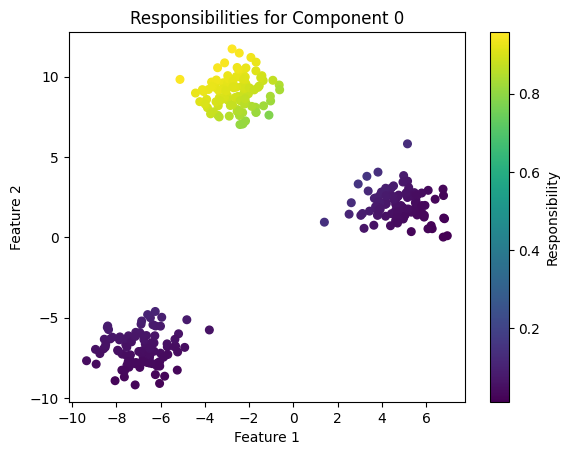

In [45]:

# Choose component index to visualize (e.g., 0)
component_idx = 0
plt.scatter(X[:, 0], X[:, 1], c=responsibilities[:, component_idx], cmap='viridis', s=30)
plt.title(f'Responsibilities for Component {component_idx}')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.colorbar(label='Responsibility')
plt.show()


### Visualization

The color intensity indicates the probability of each data point belonging to Component 0.

### Step 3: Converging the Model

#### Explanation

The EM algorithm iterates between the E-step and M-step until convergence. Convergence can be defined based on:
- **Log-Likelihood**: The algorithm stops when the increase in log-likelihood between iterations falls below a threshold.
- **Parameter Change**: The change in parameters (means, covariances, weights) is below a threshold.
- **Maximum Iterations**: A predefined number of iterations is reached.

#### Implementing the Iterative EM Algorithm

We’ll implement the iterative process with convergence criteria based on the log-likelihood.

Converged at iteration 3
Final Means:
 [[-2.63323268  9.04356978]
 [-6.88387179 -6.98398415]
 [ 4.74710337  2.01059427]]
Final Weights:
 [0.33333333 0.33333333 0.33333333]


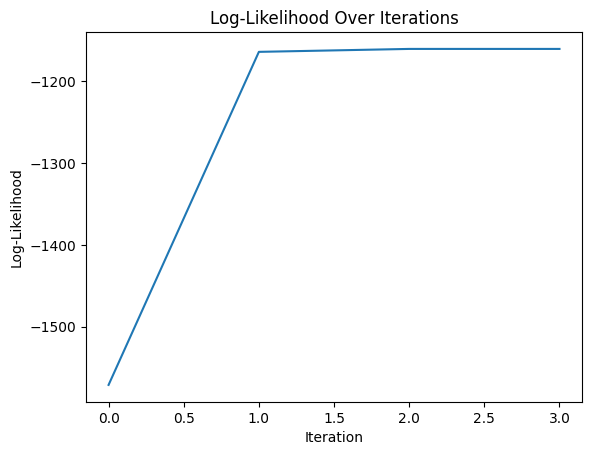

In [46]:

# Compute Log-Likelihood

def compute_log_likelihood(X, weights, means, covariances):
    """
    Computes the log-likelihood of the data given the current parameters.
    """
    n_samples = X.shape[0]
    k = len(weights)
    log_likelihood = 0
    
    for i in range(n_samples):
        prob = 0
        for j in range(k):
            rv = multivariate_normal(mean=means[j], cov=covariances[j])
            prob += weights[j] * rv.pdf(X[i])
        log_likelihood += np.log(prob)
    return log_likelihood

# EM Algorithm Function

def gmm_em(X, k, max_iters=100, tol=1e-4):
    """
    Performs the EM algorithm for GMM.
    Returns the final weights, means, covariances, and log-likelihoods.
    """
    # Initialize parameters using KMeans
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(X)
    means = kmeans.cluster_centers_
    covariances = [np.cov(X.T) for _ in range(k)]
    weights = np.full(k, 1 / k)
    
    log_likelihoods = []
    for iteration in range(max_iters):
        # E-step
        responsibilities = e_step(X, weights, means, covariances)
        
        # M-step
        weights, means, covariances = m_step(X, responsibilities)
        
        # Compute log-likelihood
        log_likelihood = compute_log_likelihood(X, weights, means, covariances)
        log_likelihoods.append(log_likelihood)
        
        # Check for convergence
        if iteration > 0:
            if abs(log_likelihoods[-1] - log_likelihoods[-2]) < tol:
                print(f'Converged at iteration {iteration}')
                break
    return weights, means, covariances, responsibilities, log_likelihoods

# Run the EM Algorithm

weights, means, covariances, responsibilities, log_likelihoods = gmm_em(X, k=3)

print("Final Means:\n", means)
print("Final Weights:\n", weights)


# Plot Log-Likelihood Over Iterations

plt.plot(log_likelihoods)
plt.title('Log-Likelihood Over Iterations')
plt.xlabel('Iteration')
plt.ylabel('Log-Likelihood')
plt.show()


### Visualization

The log-likelihood increases and stabilizes as the algorithm converges.

### Step 4: Assigning Clusters

#### Explanation

After convergence, each data point is assigned to the cluster (Gaussian component) with the highest responsibility.

#### Assigning Cluster Labels

In [47]:

cluster_labels = np.argmax(responsibilities, axis=1)



### Visualization

The log-likelihood increases and stabilizes as the algorithm converges.

### Step 4: Assigning Clusters

#### Explanation

After convergence, each data point is assigned to the cluster (Gaussian component) with the highest responsibility.

#### Assigning Cluster Labels

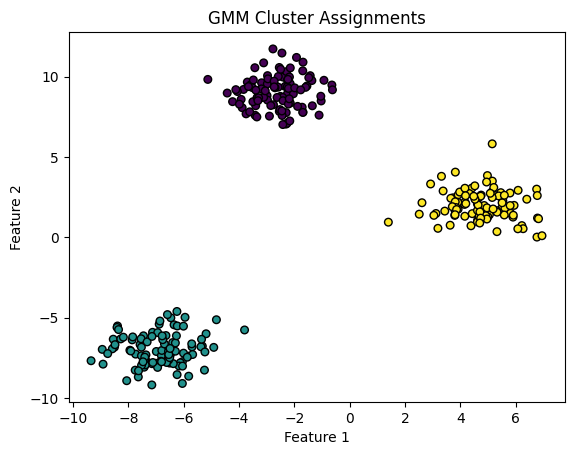

In [48]:

plt.scatter(X[:, 0], X[:, 1], c=cluster_labels, cmap='viridis', s=30, edgecolor='k')
plt.title('GMM Cluster Assignments')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.show()



Visualization:

Each color represents a cluster assigned by the GMM after convergence.

Comparing GMM with KMeans

To highlight the strengths of GMM, let’s compare its clustering results with those of KMeans.



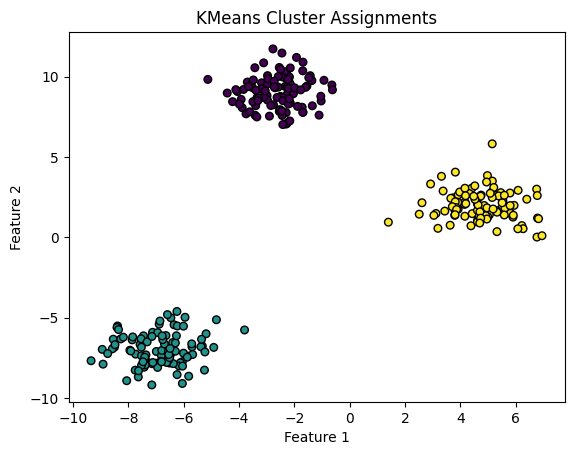

In [49]:


kmeans = KMeans(n_clusters=3, random_state=42)
kmeans_labels = kmeans.fit_predict(X)

plt.scatter(X[:, 0], X[:, 1], c=kmeans_labels, cmap='viridis', s=30, edgecolor='k')
plt.title('KMeans Cluster Assignments')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.show()


### Visualization

While KMeans partitions the data based on distance to cluster centers, GMM considers the shape and spread of clusters, potentially handling overlapping clusters better.

### Advantages of GMM over KMeans

- **Soft Clustering**: GMM provides probabilities for cluster memberships, allowing for soft assignments. KMeans assigns each point to exactly one cluster (hard clustering).
- **Cluster Shape**: GMM can model clusters with different shapes and orientations by estimating the covariance matrices. KMeans assumes spherical clusters with equal variance.
- **Overlapping Clusters**: GMM can better handle overlapping clusters due to its probabilistic nature.


Visualizing Gaussian Components

One of the key features of GMM is its ability to model clusters as Gaussian distributions. Let’s visualize these components.

Plotting the Gaussian Ellipses


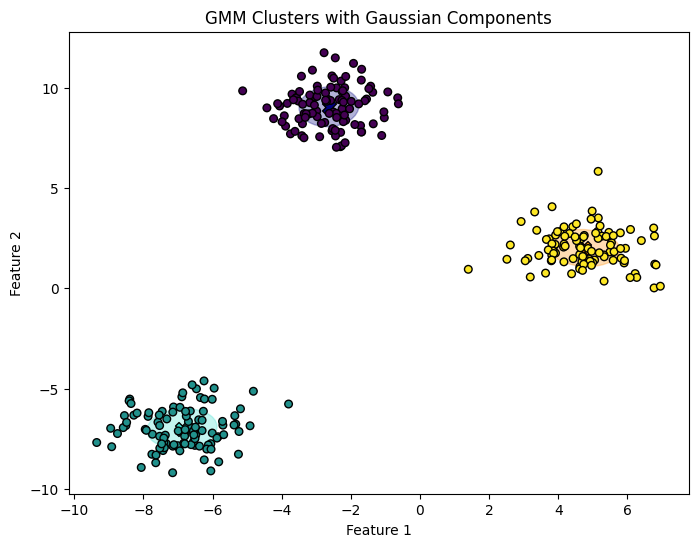

In [50]:

from matplotlib.patches import Ellipse

def plot_gaussian_components(X, means, covariances, cluster_labels):
    plt.figure(figsize=(8, 6))
    colors = ['navy', 'turquoise', 'darkorange']
    ax = plt.gca()
    
    for i, (mean, cov) in enumerate(zip(means, covariances)):
        # Plot the Gaussian components as ellipses
        eigenvalues, eigenvectors = np.linalg.eigh(cov)
        order = eigenvalues.argsort()[::-1]
        eigenvalues, eigenvectors = eigenvalues[order], eigenvectors[:, order]
        angle = np.degrees(np.arctan2(*eigenvectors[:,0][::-1]))
        width, height = 2 * np.sqrt(eigenvalues)
        ellip = Ellipse(xy=mean, width=width, height=height, angle=angle, color=colors[i], alpha=0.3)
        ax.add_patch(ellip)
        ax.scatter(mean[0], mean[1], c=colors[i], s=100, marker='X', edgecolor='k')
    
    # Plot the data points with cluster assignments
    plt.scatter(X[:, 0], X[:, 1], c=cluster_labels, cmap='viridis', s=30, edgecolor='k')
    plt.title('GMM Clusters with Gaussian Components')
    plt.xlabel('Feature 1')
    plt.ylabel('Feature 2')
    plt.show()

plot_gaussian_components(X, means, covariances, cluster_labels)


### Visualization

The ellipses represent the Gaussian components, showing the mean and covariance (shape and orientation) of each cluster.

### Summary and Conclusion

We have walked through the GMM workflow step by step:
1. **Initiating the Model**: We set the number of clusters and initialized the parameters using KMeans.
2. **The EM Algorithm**: We implemented the E-step and M-step to iteratively refine the parameters.
3. **Converging the Model**: We monitored the log-likelihood to determine convergence.
4. **Assigning Clusters**: We assigned each data point to the cluster with the highest responsibility.

#### Key Takeaways:
- **GMM is a flexible clustering method** that models the data as a mixture of Gaussian distributions.
- **It can capture clusters of different shapes and sizes** due to the covariance matrices.
- **GMM provides soft assignments**, offering probabilities for cluster memberships, which is useful in uncertain or overlapping data scenarios.
- **The EM Algorithm is central to GMM**, iteratively improving the parameters to maximize the likelihood of the data.

#### Comparison with KMeans:
- **KMeans assumes equal variance and spherical clusters**, which might not capture the true structure of the data.
- **GMM can handle more complex cluster shapes** and provides a probabilistic framework.

### Evaluation over a complex dataset

Feature names: ['sepal length (cm)', 'sepal width (cm)', 'petal length (cm)', 'petal width (cm)']
Target names: ['setosa' 'versicolor' 'virginica']
Shape of X: (150, 4)
Shape of y_true: (150,)
PCA reduced the data to 2 dimensions.


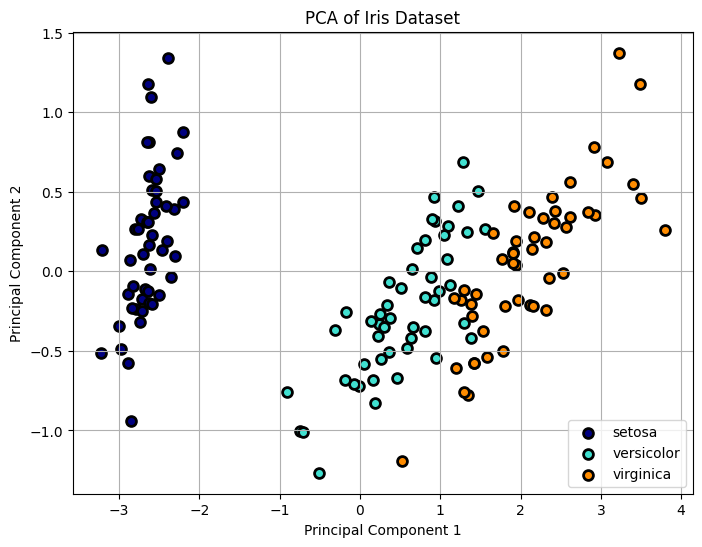

GMM Silhouette Score: 0.53
KMeans Silhouette Score: 0.60


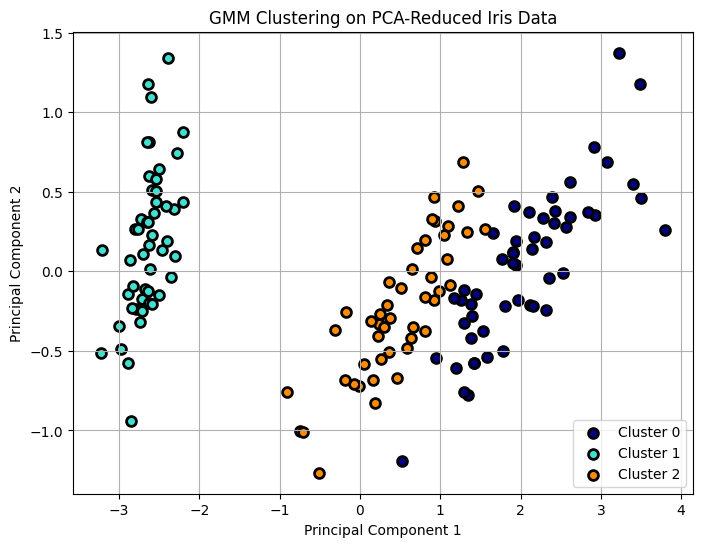

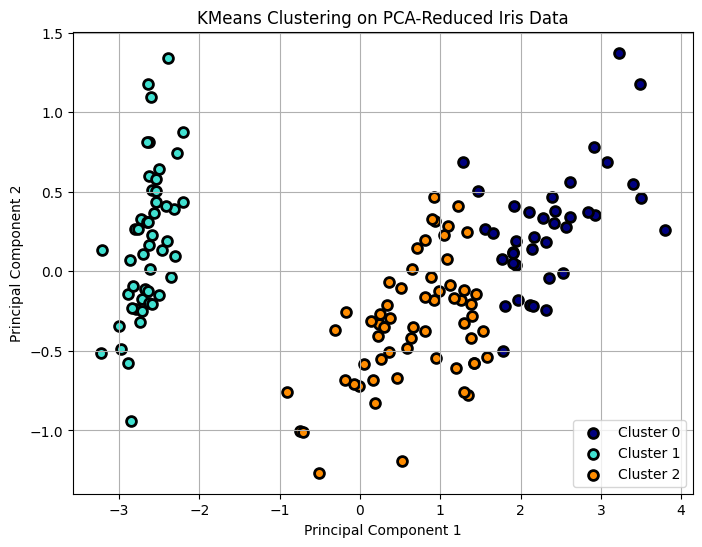

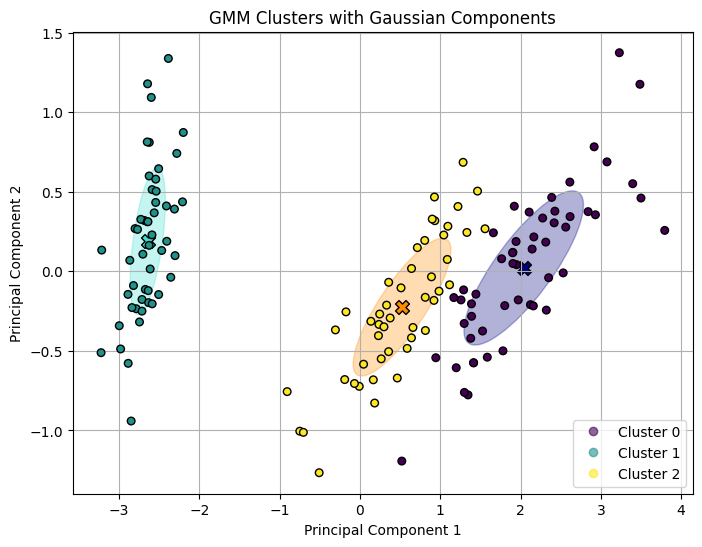


Summary of Silhouette Scores:
GMM Silhouette Score: 0.53
KMeans Silhouette Score: 0.60


In [51]:
# Import Necessary Libraries
import numpy as np
import matplotlib.pyplot as plt
from sklearn import datasets
from sklearn.mixture import GaussianMixture
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from matplotlib.patches import Ellipse
import warnings

# Suppress warnings for cleaner output
warnings.filterwarnings('ignore')

# 1. Load and Explore the Iris Dataset
def load_data():
    """
    Loads the Iris dataset and returns the features and true labels.
    """
    iris = datasets.load_iris()
    X = iris.data  # Features: sepal length, sepal width, petal length, petal width
    y_true = iris.target  # True labels
    feature_names = iris.feature_names
    target_names = iris.target_names

    print("Feature names:", feature_names)
    print("Target names:", target_names)
    print("Shape of X:", X.shape)
    print("Shape of y_true:", y_true.shape)
    
    return X, y_true, target_names

# 2. Dimensionality Reduction with PCA for Visualization
def apply_pca(X, n_components=2):
    """
    Applies Principal Component Analysis (PCA) to reduce dimensionality.
    """
    pca = PCA(n_components=n_components)
    X_pca = pca.fit_transform(X)
    print(f"PCA reduced the data to {n_components} dimensions.")
    return X_pca

# 3. Visualize the Original Data with True Labels
def plot_pca(X_pca, y_true, target_names):
    """
    Plots the PCA-reduced data with true labels.
    """
    plt.figure(figsize=(8, 6))
    colors = ['navy', 'turquoise', 'darkorange']
    for color, i, target_name in zip(colors, [0, 1, 2], target_names):
        plt.scatter(X_pca[y_true == i, 0], X_pca[y_true == i, 1],
                    color=color, lw=2, label=target_name, edgecolor='k', s=50)
    plt.title('PCA of Iris Dataset')
    plt.xlabel('Principal Component 1')
    plt.ylabel('Principal Component 2')
    plt.legend()
    plt.grid(True)
    plt.show()

# 4. Apply Gaussian Mixture Models (GMM)
def apply_gmm(X_pca, n_components=3, covariance_type='full', random_state=42):
    """
    Fits a Gaussian Mixture Model to the data and returns the model and labels.
    """
    gmm = GaussianMixture(n_components=n_components, covariance_type=covariance_type, random_state=random_state)
    gmm.fit(X_pca)
    gmm_labels = gmm.predict(X_pca)
    silhouette = silhouette_score(X_pca, gmm_labels)
    print(f"GMM Silhouette Score: {silhouette:.2f}")
    return gmm, gmm_labels, silhouette

# 5. Apply KMeans Clustering
def apply_kmeans(X_pca, n_clusters=3, random_state=42):
    """
    Fits KMeans clustering to the data and returns the model and labels.
    """
    kmeans = KMeans(n_clusters=n_clusters, random_state=random_state)
    kmeans.fit(X_pca)
    kmeans_labels = kmeans.predict(X_pca)
    silhouette = silhouette_score(X_pca, kmeans_labels)
    print(f"KMeans Silhouette Score: {silhouette:.2f}")
    return kmeans, kmeans_labels, silhouette

# 6. Visualize Clustering Results
def plot_clusters(X_pca, labels, target_names, title):
    """
    Plots the clustering results.
    """
    plt.figure(figsize=(8, 6))
    colors = ['navy', 'turquoise', 'darkorange']
    for color, i in zip(colors, range(len(np.unique(labels)))):
        plt.scatter(X_pca[labels == i, 0], X_pca[labels == i, 1],
                    color=color, lw=2, label=f'Cluster {i}', edgecolor='k', s=50)
    plt.title(title)
    plt.xlabel('Principal Component 1')
    plt.ylabel('Principal Component 2')
    plt.legend()
    plt.grid(True)
    plt.show()

# 7. Compare Clustering with True Labels
def compare_with_true_labels(X_pca, labels, title):
    """
    Plots clustering results against true labels.
    """
    plt.figure(figsize=(8, 6))
    colors = ['navy', 'turquoise', 'darkorange']
    for color, i in zip(colors, range(len(np.unique(labels)))):
        plt.scatter(X_pca[labels == i, 0], X_pca[labels == i, 1],
                    color=color, lw=2, label=f'Cluster {i}', edgecolor='k', s=50)
    plt.title(title)
    plt.xlabel('Principal Component 1')
    plt.ylabel('Principal Component 2')
    plt.legend()
    plt.grid(True)
    plt.show()

# 8. Visualize Gaussian Components
def plot_gmm_components(gmm, X_pca, title='GMM Clusters with Gaussian Components'):
    """
    Plots the GMM clusters along with the Gaussian components as ellipses.
    """
    plt.figure(figsize=(8, 6))
    colors = ['navy', 'turquoise', 'darkorange']
    ax = plt.gca()

    for i, (mean, cov) in enumerate(zip(gmm.means_, gmm.covariances_)):
        if gmm.covariance_type == 'full':
            cov_matrix = cov
        elif gmm.covariance_type == 'tied':
            cov_matrix = gmm.covariances_
        elif gmm.covariance_type == 'diag':
            cov_matrix = np.diag(cov)
        elif gmm.covariance_type == 'spherical':
            cov_matrix = np.eye(X_pca.shape[1]) * cov
        else:
            raise ValueError("Invalid covariance type")

        eigenvalues, eigenvectors = np.linalg.eigh(cov_matrix)
        order = eigenvalues.argsort()[::-1]
        eigenvalues, eigenvectors = eigenvalues[order], eigenvectors[:, order]
        angle = np.degrees(np.arctan2(*eigenvectors[:,0][::-1]))
        width, height = 2 * np.sqrt(eigenvalues)
        ellip = Ellipse(xy=mean, width=width, height=height, angle=angle, color=colors[i], alpha=0.3)
        ax.add_patch(ellip)
        ax.scatter(mean[0], mean[1], c=colors[i], s=100, marker='X', edgecolor='k')

    scatter = ax.scatter(X_pca[:, 0], X_pca[:, 1], c=gmm.predict(X_pca), cmap='viridis', s=30, zorder=2, edgecolor='k')
    plt.title(title)
    plt.xlabel('Principal Component 1')
    plt.ylabel('Principal Component 2')
    handles, _ = scatter.legend_elements(prop="colors", alpha=0.6)
    legend_labels = [f'Cluster {i}' for i in range(gmm.n_components)]
    plt.legend(handles, legend_labels)
    plt.grid(True)
    plt.show()

# 9. Main Function to Execute All Steps
def main():
    # Load Data
    X, y_true, target_names = load_data()
    
    # Apply PCA
    X_pca = apply_pca(X, n_components=2)
    
    # Plot PCA with True Labels
    plot_pca(X_pca, y_true, target_names)
    
    # Apply GMM
    gmm, gmm_labels, gmm_silhouette = apply_gmm(X_pca, n_components=3, covariance_type='full', random_state=42)
    
    # Apply KMeans
    kmeans, kmeans_labels, kmeans_silhouette = apply_kmeans(X_pca, n_clusters=3, random_state=42)
    
    # Plot GMM Clustering Results
    plot_clusters(X_pca, gmm_labels, target_names, 'GMM Clustering on PCA-Reduced Iris Data')
    
    # Plot KMeans Clustering Results
    plot_clusters(X_pca, kmeans_labels, target_names, 'KMeans Clustering on PCA-Reduced Iris Data')
    
    # Compare GMM Clustering with True Labels    
    # Visualize GMM Gaussian Components
    plot_gmm_components(gmm, X_pca, title='GMM Clusters with Gaussian Components')
    
    # Print Summary
    print("\nSummary of Silhouette Scores:")
    print(f"GMM Silhouette Score: {gmm_silhouette:.2f}")
    print(f"KMeans Silhouette Score: {kmeans_silhouette:.2f}")

# Execute the main function
if __name__ == "__main__":
    main()